# Elastica Initilization


In [ ]:
pip install pyelastica

In [ ]:
# pip install "pyelastica[examples, docs]"

# Dianes timeshenko beam

In [ ]:
class EndpointForces(self):
    """
    This class applies constant forces on the endpoint nodes.

        Attributes
        ----------
        start_force: numpy.ndarray
            1D (dim) array containing data with 'float' type. Force applied to first node of the system.
        end_force: numpy.ndarray
            1D (dim) array containing data with 'float' type. Force applied to last node of the system.
        ramp_up_time: float
            Applied forces are ramped up until ramp up time.

    """

    def __init__(self, start_force, end_force, ramp_up_time):
        """

        Parameters
        ----------
        start_force: numpy.ndarray
            1D (dim) array containing data with 'float' type.
            Force applied to first node of the system.
        end_force: numpy.ndarray
            1D (dim) array containing data with 'float' type.
            Force applied to last node of the system.
        ramp_up_time: float
            Applied forces are ramped up until ramp up time.

        """
        super(EndpointForces, self).__init__()
        self.start_force = start_force
        self.end_force = end_force
        assert ramp_up_time > 0.0
        self.ramp_up_time = ramp_up_time


    def apply_forces(self, system: SystemType, time=0.0):
        self.compute_end_point_forces(
            system.external_forces,
            self.start_force,
            self.end_force,
            time,
            self.ramp_up_time,
        )

    @staticmethod
    @njit(cache=True)
    def compute_end_point_forces(
        self, external_forces, start_force, end_force, time, ramp_up_time
    ):
        """
        Compute end point forces that are applied on the rod using numba njit decorator.

        Parameters
        ----------
        external_forces: numpy.ndarray
            2D (dim, blocksize) array containing data with 'float' type. External force vector.
        start_force: numpy.ndarray
            1D (dim) array containing data with 'float' type.
        end_force: numpy.ndarray
            1D (dim) array containing data with 'float' type.
            Force applied to last node of the system.
        time: float
        ramp_up_time: float
            Applied forces are ramped up until ramp up time.

        Returns
        -------

        """
        w = 0.5 #omgea present in sinsusioidal function

        factor = min(1.0, time / ramp_up_time)
        external_forces[..., 0] += start_force * factor * np.sin(w*time)
        external_forces[..., -1] += end_force * factor * np.sin(w*time)
        print("HELLO I WAS UTILIZED")



NameError: ignored

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.colors import to_rgb
import elastica as ea

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.colors import to_rgb


def analytical_shearable(arg_rod, arg_end_force, n_elem=500):
    base_length = np.sum(arg_rod.rest_lengths)
    arg_s = np.linspace(0.0, base_length, n_elem)
    if type(arg_end_force) is np.ndarray:
        acting_force = arg_end_force[np.nonzero(arg_end_force)]
    else:
        acting_force = arg_end_force
    acting_force = np.abs(acting_force)

    linear_prefactor = -acting_force / arg_rod.shear_matrix[0, 0, 0]
    quadratic_prefactor = (
        -acting_force
        * np.sum(arg_rod.rest_lengths)
        / 2.0
        / arg_rod.bend_matrix[0, 0, 0]
    )
    cubic_prefactor = acting_force / 6.0 / arg_rod.bend_matrix[0, 0, 0]
    return (
        arg_s,
        arg_s
        * (linear_prefactor + arg_s * (quadratic_prefactor + arg_s * cubic_prefactor)),
    )


def analytical_unshearable(arg_rod, arg_end_force, n_elem=500):
    base_length = np.sum(arg_rod.rest_lengths)
    arg_s = np.linspace(0.0, base_length, n_elem)
    if type(arg_end_force) is np.ndarray:
        acting_force = arg_end_force[np.nonzero(arg_end_force)]
    else:
        acting_force = arg_end_force
    acting_force = np.abs(acting_force)

    quadratic_prefactor = (
        -acting_force
        * np.sum(arg_rod.rest_lengths)
        / 2.0
        / arg_rod.bend_matrix[0, 0, 0]
    )
    cubic_prefactor = acting_force / 6.0 / arg_rod.bend_matrix[0, 0, 0]
    return arg_s, arg_s ** 2 * (quadratic_prefactor + arg_s * cubic_prefactor)


def plot_timoshenko(rod, end_force, SAVE_FIGURE, ADD_UNSHEARABLE_ROD=False):
    fig = plt.figure(figsize=(10, 8), frameon=True, dpi=150)
    ax = fig.add_subplot(111)
    ax.grid(which="minor", color="k", linestyle="--")
    ax.grid(which="major", color="k", linestyle="-")
    analytical_shearable_positon = analytical_shearable(rod, end_force)
    ax.plot(
        analytical_shearable_positon[0],
        analytical_shearable_positon[1],
        "k--",
        label="Timoshenko",
    )
    ax.plot(
        rod.position_collection[2, ...],
        rod.position_collection[0, ...],
        c=to_rgb("xkcd:bluish"),
        label="n=" + str(rod.n_elems),
    )
    if ADD_UNSHEARABLE_ROD:
        analytical_unshearable_positon = analytical_unshearable(rod, end_force)
        ax.plot(
            analytical_unshearable_positon[0],
            analytical_unshearable_positon[1],
            "r-.",
            label="Euler-Bernoulli",
        )
    fig.legend(prop={"size": 20})
    plt.show()
    if SAVE_FIGURE:
        fig.savefig("Timoshenko_beam_test" + str(rod.n_elems) + ".png")

Total steps 476190


100%|██████████| 476190/476190 [01:26<00:00, 5496.96it/s]


Final time of simulation is :  999.9999999824328


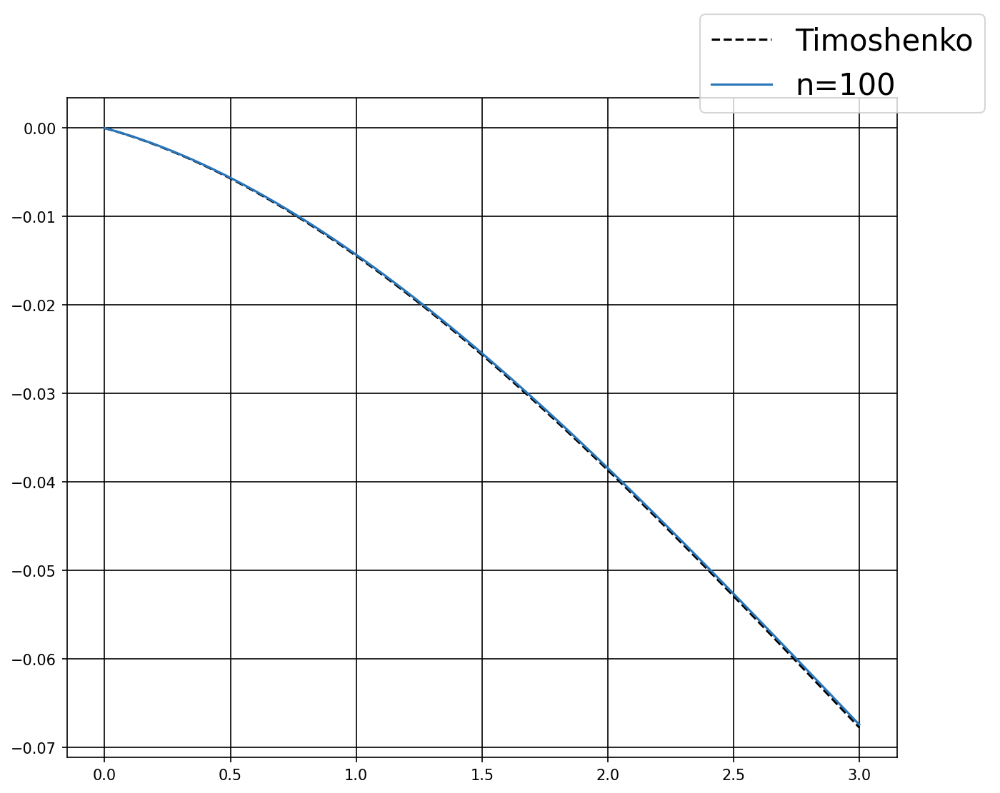

In [ ]:
class TimoshenkoBeamSimulator(
    ea.BaseSystemCollection, ea.Constraints, ea.Forcing, ea.CallBacks, ea.Damping
):
    pass


timoshenko_sim = TimoshenkoBeamSimulator()
final_time = 1000.0

# Options
PLOT_FIGURE = True
SAVE_FIGURE = True
SAVE_RESULTS = False
ADD_UNSHEARABLE_ROD = False

# setting up test params
n_elem = 100
start = np.zeros((3,))
direction = np.array([0.0, 0.0, 1.0])
normal = np.array([0.0, 1.0, 0.0])
base_length = 3.0
base_radius = 0.25
base_area = np.pi * base_radius ** 2
density = 5000
nu = 0.1 / 7 / density / base_area
E = 1e6
# For shear modulus of 1e4, nu is 99!
poisson_ratio = 99
shear_modulus = E / (poisson_ratio + 1.0)

shearable_rod = ea.CosseratRod.straight_rod(
    n_elem,
    start,
    direction,
    normal,
    base_length,
    base_radius,
    density,
    youngs_modulus=E,
    shear_modulus=shear_modulus,
)

timoshenko_sim.append(shearable_rod)
# add damping
dl = base_length / n_elem
dt = 0.07 * dl
timoshenko_sim.dampen(shearable_rod).using(
    ea.AnalyticalLinearDamper,
    damping_constant=nu,
    time_step=dt,
)

timoshenko_sim.constrain(shearable_rod).using(
    ea.OneEndFixedBC, constrained_position_idx=(0,), constrained_director_idx=(0,)
)



end_force = np.array([-15.0, 0.0, 0.0])
timoshenko_sim.add_forcing_to(shearable_rod).using(
    ea.EndpointForces, 0.0 * end_force, end_force, ramp_up_time=final_time / 2.0
)


if ADD_UNSHEARABLE_ROD:
    # Start into the plane
    unshearable_start = np.array([0.0, -1.0, 0.0])
    shear_modulus = E / (-0.7 + 1.0)
    unshearable_rod = ea.CosseratRod.straight_rod(
        n_elem,
        unshearable_start,
        direction,
        normal,
        base_length,
        base_radius,
        density,
        youngs_modulus=E,
        # Unshearable rod needs G -> inf, which is achievable with -ve poisson ratio
        shear_modulus=shear_modulus,
    )

    timoshenko_sim.append(unshearable_rod)

    # add damping
    timoshenko_sim.dampen(unshearable_rod).using(
        ea.AnalyticalLinearDamper,
        damping_constant=nu,
        time_step=dt,
    )
    timoshenko_sim.constrain(unshearable_rod).using(
        ea.OneEndFixedBC, constrained_position_idx=(0,), constrained_director_idx=(0,)
    )
    timoshenko_sim.add_forcing_to(unshearable_rod).using(
        ea.EndpointForces, 0.0 * end_force, end_force, ramp_up_time=final_time / 2.0
    )

# Add call backs
class VelocityCallBack(ea.CallBackBaseClass):
    """
    Tracks the velocity norms of the rod
    """

    def __init__(self, step_skip: int, callback_params: dict):
        ea.CallBackBaseClass.__init__(self)
        self.every = step_skip
        self.callback_params = callback_params

    def make_callback(self, system, time, current_step: int):

        if current_step % self.every == 0:

            self.callback_params["time"].append(time)
            # Collect x
            self.callback_params["velocity_norms"].append(
                np.linalg.norm(system.velocity_collection.copy())
            )
            return


recorded_history = ea.defaultdict(list)
timoshenko_sim.collect_diagnostics(shearable_rod).using(
    VelocityCallBack, step_skip=500, callback_params=recorded_history
)

timoshenko_sim.finalize()
timestepper = ea.PositionVerlet()
# timestepper = PEFRL()

total_steps = int(final_time / dt)
print("Total steps", total_steps)
ea.integrate(timestepper, timoshenko_sim, final_time, total_steps)

if PLOT_FIGURE:
    plot_timoshenko(shearable_rod, end_force, SAVE_FIGURE, ADD_UNSHEARABLE_ROD)

if SAVE_RESULTS:
    import pickle

    filename = "Timoshenko_beam_data.dat"
    file = open(filename, "wb")
    pickle.dump(shearable_rod, file)
    file.close()

    tv = (
        np.asarray(recorded_history["time"]),
        np.asarray(recorded_history["velocity_norms"]),
    )

    def as_time_series(v):
        return v.T

    np.savetxt(
        "velocity_norms.csv",
        as_time_series(np.stack(tv)),
        delimiter=",",
    )

# Snake Case

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.colors import to_rgb
from tqdm import tqdm


def plot_snake_velocity(
    plot_params: dict,
    period,
    filename="slithering_snake_velocity.png",
    SAVE_FIGURE=False,
):
    time_per_period = np.array(plot_params["time"]) / period
    avg_velocity = np.array(plot_params["avg_velocity"])

    [
        velocity_in_direction_of_rod,
        velocity_in_rod_roll_dir,
        _,
        _,
    ] = compute_projected_velocity(plot_params, period)

    fig = plt.figure(figsize=(10, 8), frameon=True, dpi=150)
    plt.rcParams.update({"font.size": 16})
    ax = fig.add_subplot(111)
    ax.grid(which="minor", color="k", linestyle="--")
    ax.grid(which="major", color="k", linestyle="-")
    ax.plot(
        time_per_period[:], velocity_in_direction_of_rod[:, 2], "r-", label="forward"
    )
    ax.plot(
        time_per_period[:],
        velocity_in_rod_roll_dir[:, 0],
        c=to_rgb("xkcd:bluish"),
        label="lateral",
    )
    ax.plot(time_per_period[:], avg_velocity[:, 1], "k-", label="normal")
    ax.set_ylabel("Velocity [m/s]", fontsize=16)
    ax.set_xlabel("Time [s]", fontsize=16)
    fig.legend(prop={"size": 20})
    plt.show()
    # Be a good boy and close figures
    # https://stackoverflow.com/a/37451036
    # plt.close(fig) alone does not suffice
    # See https://github.com/matplotlib/matplotlib/issues/8560/
    plt.close(plt.gcf())

    if SAVE_FIGURE:
        fig.savefig(filename)


def plot_video(
    plot_params: dict,
    video_name="video.mp4",
    fps=15,
    xlim=(0, 4),
    ylim=(-1, 1),
):  # (time step, x/y/z, node)
    import matplotlib.animation as manimation

    positions_over_time = np.array(plot_params["position"])

    print("plot video")
    FFMpegWriter = manimation.writers["ffmpeg"]
    metadata = dict(title="Movie Test", artist="Matplotlib", comment="Movie support!")
    writer = FFMpegWriter(fps=fps, metadata=metadata)
    fig = plt.figure(figsize=(10, 8), frameon=True, dpi=150)
    ax = fig.add_subplot(111)
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.set_xlabel("z [m]", fontsize=16)
    ax.set_ylabel("x [m]", fontsize=16)
    rod_lines_2d = ax.plot(positions_over_time[0][2], positions_over_time[0][0])[0]
    # plt.axis("equal")
    with writer.saving(fig, video_name, dpi=150):
        for time in tqdm(range(1, len(plot_params["time"]))):
            rod_lines_2d.set_xdata(positions_over_time[time][2])
            rod_lines_2d.set_ydata(positions_over_time[time][0])
            writer.grab_frame()

    # Be a good boy and close figures
    # https://stackoverflow.com/a/37451036
    # plt.close(fig) alone does not suffice
    # See https://github.com/matplotlib/matplotlib/issues/8560/
    plt.close(plt.gcf())


def compute_projected_velocity(plot_params: dict, period):

    time_per_period = np.array(plot_params["time"]) / period
    avg_velocity = np.array(plot_params["avg_velocity"])
    center_of_mass = np.array(plot_params["center_of_mass"])

    # Compute rod velocity in rod direction. We need to compute that because,
    # after snake starts to move it chooses an arbitrary direction, which does not
    # have to be initial tangent direction of the rod. Thus we need to project the
    # snake velocity with respect to its new tangent and roll direction, after that
    # we will get the correct forward and lateral speed. After this projection
    # lateral velocity of the snake has to be oscillating between + and - values with
    # zero mean.

    # Number of steps in one period.
    period_step = int(1.0 / (time_per_period[-1] - time_per_period[-2]))
    number_of_period = int(time_per_period[-1])

    # Center of mass position averaged in one period
    center_of_mass_averaged_over_one_period = np.zeros((number_of_period - 2, 3))
    for i in range(1, number_of_period - 1):
        # position of center of mass averaged over one period
        center_of_mass_averaged_over_one_period[i - 1] = np.mean(
            center_of_mass[(i + 1) * period_step : (i + 2) * period_step]
            - center_of_mass[(i + 0) * period_step : (i + 1) * period_step],
            axis=0,
        )
    # Average the rod directions over multiple periods and get the direction of the rod.
    direction_of_rod = np.mean(center_of_mass_averaged_over_one_period, axis=0)
    direction_of_rod /= np.linalg.norm(direction_of_rod, ord=2)

    # Compute the projected rod velocity in the direction of the rod
    velocity_mag_in_direction_of_rod = np.einsum(
        "ji,i->j", avg_velocity, direction_of_rod
    )
    velocity_in_direction_of_rod = np.einsum(
        "j,i->ji", velocity_mag_in_direction_of_rod, direction_of_rod
    )

    # Get the lateral or roll velocity of the rod after subtracting its projected
    # velocity in the direction of rod
    velocity_in_rod_roll_dir = avg_velocity - velocity_in_direction_of_rod

    # Compute the average velocity over the simulation, this can be used for optimizing snake
    # for fastest forward velocity. We start after first period, because of the ramping up happens
    # in first period.
    average_velocity_over_simulation = np.mean(
        velocity_in_direction_of_rod[period_step * 2 :], axis=0
    )

    return (
        velocity_in_direction_of_rod,
        velocity_in_rod_roll_dir,
        average_velocity_over_simulation[2],
        average_velocity_over_simulation[0],
    )


def plot_curvature(
    plot_params: dict,
    rest_lengths,
    period,
    save_fig=False,
    filename="continuum_snake_curvature",
):
    s = np.cumsum(rest_lengths)
    L0 = s[-1]
    s = s / L0
    s = s[:-1].copy()
    x = np.linspace(0, 1, 100)
    curvature = np.array(plot_params["curvature"])
    time = np.array(plot_params["time"])
    peak_time = period * 0.125
    dt = time[1] - time[0]
    peak_idx = int(peak_time / (dt))
    plt.rcParams.update({"font.size": 16})
    fig = plt.figure(figsize=(10, 8), frameon=True, dpi=150)
    ax = fig.add_subplot(111)
    try:
        for i in range(peak_idx * 8, peak_idx * 8 * 2, peak_idx):
            ax.plot(s, curvature[i, 0, :] * L0, "k")
    except:
        print("Simulation time not long enough to plot curvature")
    ax.plot(
        x, 7 * np.cos(2 * np.pi * x - 0.80), "--", label="stereotypical snake curvature"
    )
    ax.set_ylabel(r"$\kappa$", fontsize=16)
    ax.set_xlabel("s", fontsize=16)
    ax.set_xlim(0, 1)
    ax.set_ylim(-10, 10)
    fig.legend(prop={"size": 16})
    plt.show()
    if save_fig:
        fig.savefig(filename)

    # Be a good boy and close figures
    # https://stackoverflow.com/a/37451036
    # plt.close(fig) alone does not suffice
    # See https://github.com/matplotlib/matplotlib/issues/8560/
    plt.close(plt.gcf())

In [ ]:
__doc__ = """Snake friction case from X. Zhang et. al. Nat. Comm. 2021"""

import os
import numpy as np
import elastica as ea

'''
from examples.ContinuumSnakeCase.continuum_snake_postprocessing import (
    plot_snake_velocity,
    plot_video,
    compute_projected_velocity,
    plot_curvature,
)
'''


class SnakeSimulator(
    ea.BaseSystemCollection, ea.Constraints, ea.Forcing, ea.Damping, ea.CallBacks
):
    pass


def run_snake(
    b_coeff, PLOT_FIGURE=False, SAVE_FIGURE=False, SAVE_VIDEO=False, SAVE_RESULTS=False
):
    # Initialize the simulation class
    snake_sim = SnakeSimulator()

    # Simulation parameters
    period = 2
    final_time = (11.0 + 0.01) * period

    # setting up test params
    n_elem = 50
    start = np.zeros((3,))
    direction = np.array([0.0, 0.0, 1.0])
    normal = np.array([0.0, 1.0, 0.0])
    base_length = 0.35
    base_radius = base_length * 0.011
    density = 1000
    E = 1e6
    poisson_ratio = 0.5
    shear_modulus = E / (poisson_ratio + 1.0)

    shearable_rod = ea.CosseratRod.straight_rod(
        n_elem,
        start,
        direction,
        normal,
        base_length,
        base_radius,
        density,
        youngs_modulus=E,
        shear_modulus=shear_modulus,
    )

    snake_sim.append(shearable_rod)

    # Add gravitational forces
    gravitational_acc = -9.80665
    snake_sim.add_forcing_to(shearable_rod).using(
        ea.GravityForces, acc_gravity=np.array([0.0, gravitational_acc, 0.0])
    )

    # Add muscle torques
    wave_length = b_coeff[-1]
    snake_sim.add_forcing_to(shearable_rod).using(
        ea.MuscleTorques,
        base_length=base_length,
        b_coeff=b_coeff[:-1],
        period=period,
        wave_number=2.0 * np.pi / (wave_length),
        phase_shift=0.0,
        rest_lengths=shearable_rod.rest_lengths,
        ramp_up_time=period,
        direction=normal,
        with_spline=True,
    )

    # Add friction forces
    origin_plane = np.array([0.0, -base_radius, 0.0])
    normal_plane = normal
    slip_velocity_tol = 1e-8
    froude = 0.1
    mu = base_length / (period * period * np.abs(gravitational_acc) * froude)
    kinetic_mu_array = np.array(
        [mu, 1.5 * mu, 2.0 * mu]
    )  # [forward, backward, sideways]
    static_mu_array = np.zeros(kinetic_mu_array.shape)
    snake_sim.add_forcing_to(shearable_rod).using(
        ea.AnisotropicFrictionalPlane,
        k=1.0,
        nu=1e-6,
        plane_origin=origin_plane,
        plane_normal=normal_plane,
        slip_velocity_tol=slip_velocity_tol,
        static_mu_array=static_mu_array,
        kinetic_mu_array=kinetic_mu_array,
    )

    # add damping
    damping_constant = 2e-3
    time_step = 1e-4
    snake_sim.dampen(shearable_rod).using(
        ea.AnalyticalLinearDamper,
        damping_constant=damping_constant,
        time_step=time_step,
    )

    total_steps = int(final_time / time_step)
    rendering_fps = 60
    step_skip = int(1.0 / (rendering_fps * time_step))

    # Add call backs
    class ContinuumSnakeCallBack(ea.CallBackBaseClass):
        """
        Call back function for continuum snake
        """

        def __init__(self, step_skip: int, callback_params: dict):
            ea.CallBackBaseClass.__init__(self)
            self.every = step_skip
            self.callback_params = callback_params

        def make_callback(self, system, time, current_step: int):

            if current_step % self.every == 0:

                self.callback_params["time"].append(time)
                self.callback_params["step"].append(current_step)
                self.callback_params["position"].append(
                    system.position_collection.copy()
                )
                self.callback_params["velocity"].append(
                    system.velocity_collection.copy()
                )
                self.callback_params["avg_velocity"].append(
                    system.compute_velocity_center_of_mass()
                )

                self.callback_params["center_of_mass"].append(
                    system.compute_position_center_of_mass()
                )
                self.callback_params["curvature"].append(system.kappa.copy())

                return

    pp_list = ea.defaultdict(list)
    snake_sim.collect_diagnostics(shearable_rod).using(
        ContinuumSnakeCallBack, step_skip=step_skip, callback_params=pp_list
    )

    snake_sim.finalize()

    timestepper = ea.PositionVerlet()
    ea.integrate(timestepper, snake_sim, final_time, total_steps)

    if PLOT_FIGURE:
        filename_plot = "continuum_snake_velocity.png"
        plot_snake_velocity(pp_list, period, filename_plot, SAVE_FIGURE)
        plot_curvature(pp_list, shearable_rod.rest_lengths, period, SAVE_FIGURE)

        if SAVE_VIDEO:
            filename_video = "continuum_snake.mp4"
            plot_video(
                pp_list,
                video_name=filename_video,
                fps=rendering_fps,
                xlim=(0, 4),
                ylim=(-1, 1),
            )

    if SAVE_RESULTS:
        import pickle

        filename = "continuum_snake.dat"
        file = open(filename, "wb")
        pickle.dump(pp_list, file)
        file.close()

    # Compute the average forward velocity. These will be used for optimization.
    [_, _, avg_forward, avg_lateral] = compute_projected_velocity(pp_list, period)

    return avg_forward, avg_lateral, pp_list


if __name__ == "__main__":

    # Options
    PLOT_FIGURE = True
    SAVE_FIGURE = True
    SAVE_VIDEO = True
    SAVE_RESULTS = False
    CMA_OPTION = False

    if CMA_OPTION:
        import cma

        SAVE_OPTIMIZED_COEFFICIENTS = False

        def optimize_snake(spline_coefficient):
            [avg_forward, _, _] = run_snake(
                spline_coefficient,
                PLOT_FIGURE=False,
                SAVE_FIGURE=False,
                SAVE_VIDEO=False,
                SAVE_RESULTS=False,
            )
            return -avg_forward

        # Optimize snake for forward velocity. In cma.fmin first input is function
        # to be optimized, second input is initial guess for coefficients you are optimizing
        # for and third input is standard deviation you initially set.
        optimized_spline_coefficients = cma.fmin(optimize_snake, 7 * [0], 0.5)

        # Save the optimized coefficients to a file
        filename_data = "optimized_coefficients.txt"
        if SAVE_OPTIMIZED_COEFFICIENTS:
            assert filename_data != "", "provide a file name for coefficients"
            np.savetxt(filename_data, optimized_spline_coefficients, delimiter=",")

    else:
        # Add muscle forces on the rod
        if os.path.exists("optimized_coefficients.txt"):
            t_coeff_optimized = np.genfromtxt(
                "optimized_coefficients.txt", delimiter=","
            )
        else:
            wave_length = 1.0
            t_coeff_optimized = np.array(
                [3.4e-3, 3.3e-3, 4.2e-3, 2.6e-3, 3.6e-3, 3.5e-3]
            )
            t_coeff_optimized = np.hstack((t_coeff_optimized, wave_length))

        # run the simulation
        [avg_forward, avg_lateral, pp_list] = run_snake(
            t_coeff_optimized, PLOT_FIGURE, SAVE_FIGURE, SAVE_VIDEO, SAVE_RESULTS
        )

        print("average forward velocity:", avg_forward)
        print("average forward lateral:", avg_lateral)

ImportError: ignored

# Final Project - Our elastica for an I-beam


To do:

1) Implement Timeshenko (DONE! YAY) (as a group :) )

2) Implement inclined connect (Yuree)

3) Implement axial deformation on end of I-beam (Aarish)

Goal: Finish by Wednesday (11/29)

To do:

1) Test! Manual optimization of processes (Diane)

- Find forces to apply, length of I-beam (constant), constraints for height and width of the I-beam, implement steel material properties for shear and youngs modulus + other properties

- Experiment with different heights and widths once all other properties are configured (manual implementaton of our CMA)

Goal: Finish by Friday (12/1)

2) Implement CMA (Yuree + Aarish + maybe Diane?)

Goal: Finish by Sunday (12/3)

To do:

1) Presentation

Goal: Finish by Monday (12/4)

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.colors import to_rgb
import elastica as ea

# Aarish doing weird mystical code things

How to change bending and shear matrices -- 11/30/2023

.bend_matrix (3, 3, n_elem - 1 --> n_voronoi)

.shear_matrix (3, 3, n_elem)

increase num elem --> decrease dt

- change by the same scaling / order of magnitude

dt = 0.07 * dl (timoshenko case)

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.colors import to_rgb
from scipy.spatial.transform import Rotation

def plot_position(
    plot_params_rod1: dict,
    plot_params_rod2: dict,
    filename="spherical_joint_test.png",
    SAVE_FIGURE=False,
):

    position_of_rod1 = np.array(plot_params_rod1["position"])
    position_of_rod2 = np.array(plot_params_rod2["position"])

    fig = plt.figure(figsize=(10, 10), frameon=True, dpi=150)
    ax = fig.add_subplot(111)

    ax.grid(which="minor", color="k", linestyle="--")
    ax.grid(which="major", color="k", linestyle="-")
    ax.plot(position_of_rod1[:, 0, -1], position_of_rod1[:, 1, -1], "r-", label="rod1")
    ax.plot(
        position_of_rod2[:, 0, -1],
        position_of_rod2[:, 1, -1],
        c=to_rgb("xkcd:bluish"),
        label="rod2",
    )

    fig.legend(prop={"size": 20})

    plt.show()

    if SAVE_FIGURE:
        fig.savefig(filename)


def plot_orientation(title, time, directors):
    quat = []
    for t in range(len(time)):
        quat_t = Rotation.from_matrix(directors[t].T).as_quat()
        quat.append(quat_t)
    quat = np.array(quat)

    plt.figure(num=title)
    plt.plot(time, quat[:, 0], label="x")
    plt.plot(time, quat[:, 1], label="y")
    plt.plot(time, quat[:, 2], label="z")
    plt.plot(time, quat[:, 3], label="w")
    plt.title(title)
    plt.legend()
    plt.xlabel("Time [s]")
    plt.ylabel("Quaternion")
    plt.show()


def plot_video(
    plot_params_rod1: dict,
    plot_params_rod2: dict,
    video_name="video.mp4",
    margin=0.2,
    fps=15,
):  # (time step, x/y/z, node)
    import matplotlib.animation as manimation

    time = plot_params_rod1["time"]
    position_of_rod1 = np.array(plot_params_rod1["position"])
    position_of_rod2 = np.array(plot_params_rod2["position"])

    print("plot video")
    FFMpegWriter = manimation.writers["ffmpeg"]
    metadata = dict(title="Movie Test", artist="Matplotlib", comment="Movie support!")
    writer = FFMpegWriter(fps=fps, metadata=metadata)
    fig = plt.figure(figsize=(10, 8), frameon=True, dpi=150)
    with writer.saving(fig, video_name, 100):
        for time in range(1, len(time)):
            fig.clf()
            ax = plt.axes(projection="3d")  # fig.add_subplot(111)
            ax.grid(which="minor", color="k", linestyle="--")
            ax.grid(which="major", color="k", linestyle="-")
            ax.plot(
                position_of_rod1[time, 0],
                position_of_rod1[time, 1],
                position_of_rod1[time, 2],
                "or",
                label="rod1",
            )
            ax.plot(
                position_of_rod2[time, 0],
                position_of_rod2[time, 1],
                position_of_rod2[time, 2],
                "o",
                c=to_rgb("xkcd:bluish"),
                label="rod2",
            )

            ax.set_xlim(-5, 5)
            ax.set_ylim(-5, 5)
            ax.set_zlim(0, 6)
            writer.grab_frame()


def plot_video_xy(
    plot_params_rod1: dict,
    plot_params_rod2: dict,
    video_name="video.mp4",
    margin=0.2,
    fps=15,
):  # (time step, x/y/z, node)
    import matplotlib.animation as manimation

    time = plot_params_rod1["time"]
    position_of_rod1 = np.array(plot_params_rod1["position"])
    position_of_rod2 = np.array(plot_params_rod2["position"])

    print("plot video xy")
    FFMpegWriter = manimation.writers["ffmpeg"]
    metadata = dict(title="Movie Test", artist="Matplotlib", comment="Movie support!")
    writer = FFMpegWriter(fps=fps, metadata=metadata)
    fig = plt.figure()
    plt.axis("equal")
    with writer.saving(fig, video_name, 100):
        for time in range(1, len(time)):
            fig.clf()
            plt.plot(
                position_of_rod1[time, 0], position_of_rod1[time, 1], "or", label="rod1"
            )
            plt.plot(
                position_of_rod2[time, 0],
                position_of_rod2[time, 1],
                "o",
                c=to_rgb("xkcd:bluish"),
                label="rod2",
            )

            plt.xlim([-5, 5])
            plt.ylim([-5, 5])
            writer.grab_frame()


def plot_video_xz(
    plot_params_rod1: dict,
    plot_params_rod2: dict,
    video_name="video.mp4",
    margin=0.2,
    fps=15,
):  # (time step, x/y/z, node)
    import matplotlib.animation as manimation

    time = plot_params_rod1["time"]
    position_of_rod1 = np.array(plot_params_rod1["position"])
    position_of_rod2 = np.array(plot_params_rod2["position"])

    print("plot video xz")
    FFMpegWriter = manimation.writers["ffmpeg"]
    metadata = dict(title="Movie Test", artist="Matplotlib", comment="Movie support!")
    writer = FFMpegWriter(fps=fps, metadata=metadata)
    fig = plt.figure()
    plt.axis("equal")
    with writer.saving(fig, video_name, 100):
        for time in range(1, len(time)):
            fig.clf()
            plt.plot(
                position_of_rod1[time, 0], position_of_rod1[time, 2], "or", label="rod1"
            )
            plt.plot(
                position_of_rod2[time, 0],
                position_of_rod2[time, 2],
                "o",
                c=to_rgb("xkcd:bluish"),
                label="rod2",
            )

            plt.xlim([-5, 5])
            plt.ylim([-5, 5])
            writer.grab_frame()

Total steps 100000


100%|██████████| 100000/100000 [00:08<00:00, 11833.59it/s]


Final time of simulation is :  9.999999999983364


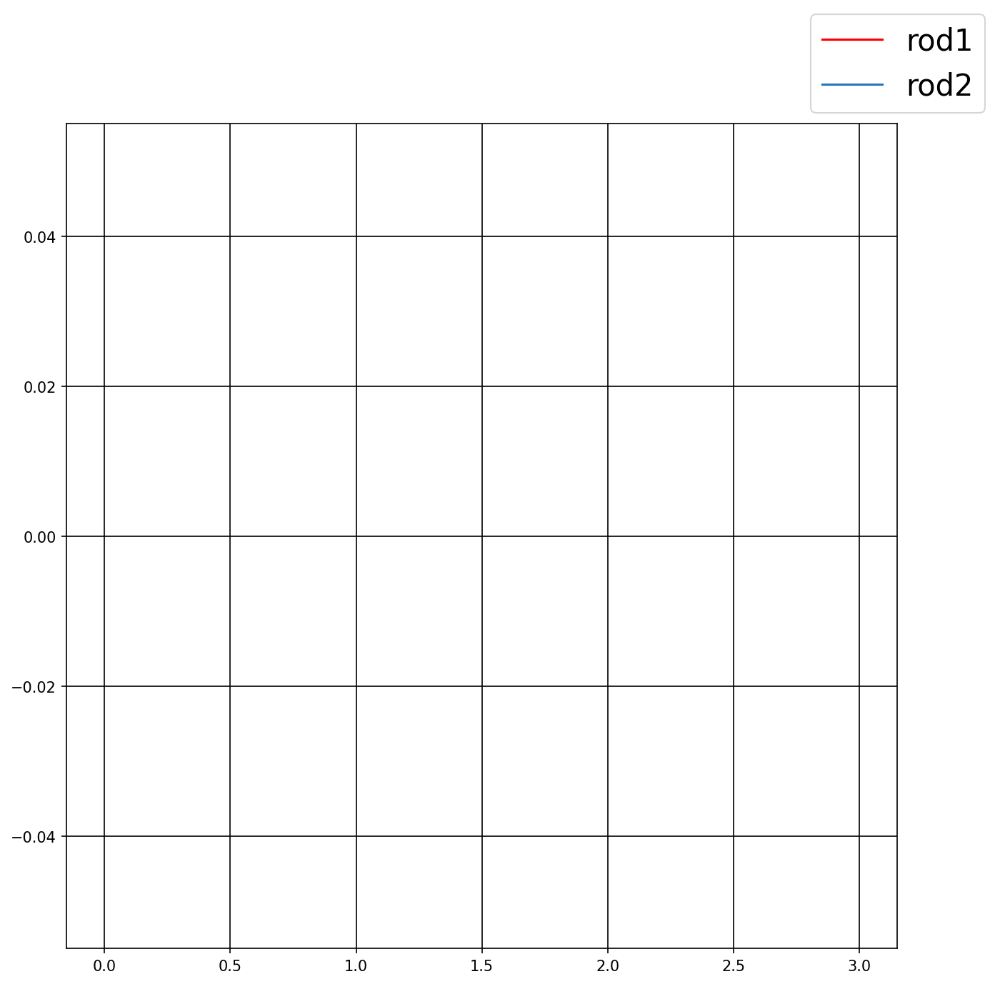

plot video
plot video xy
plot video xz


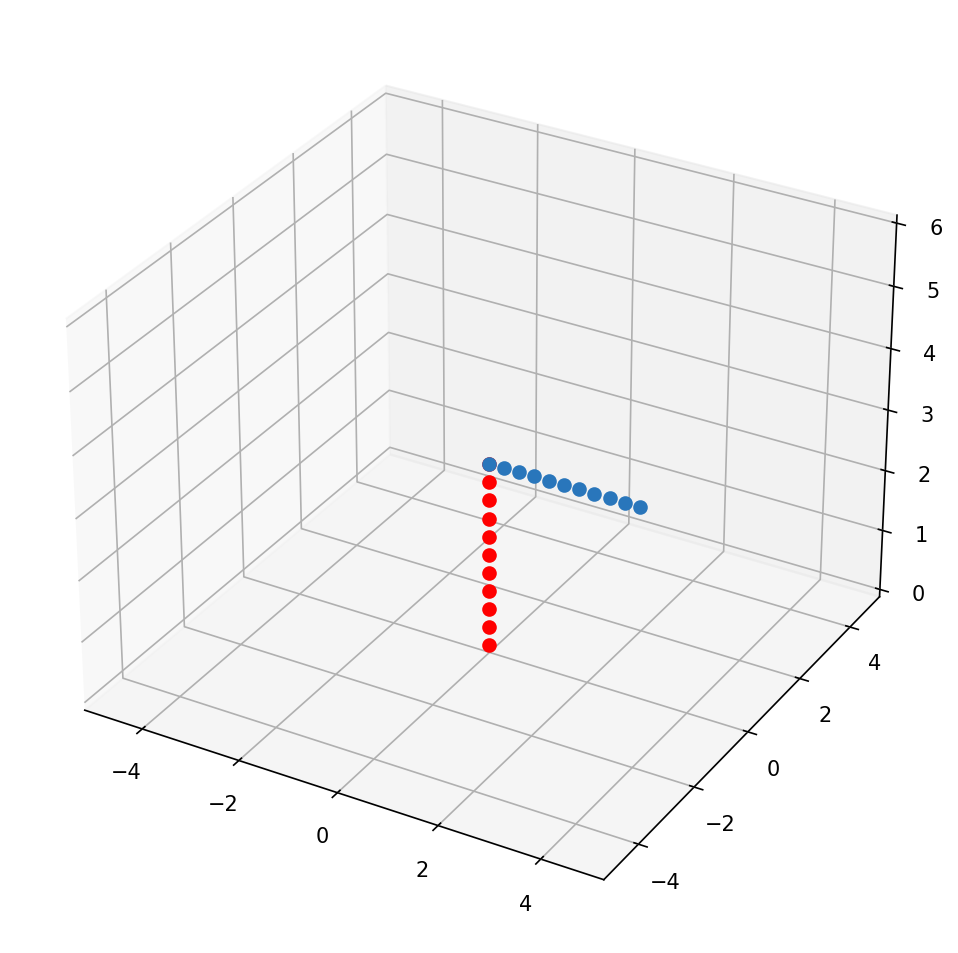

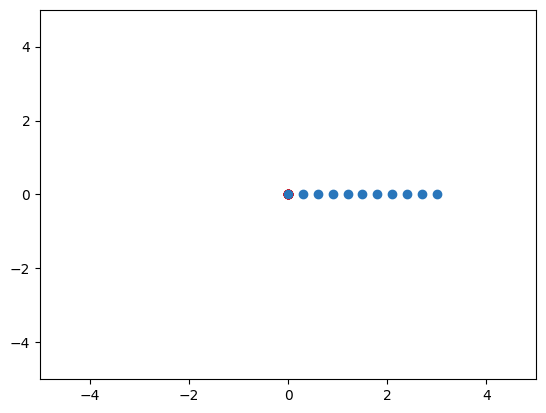

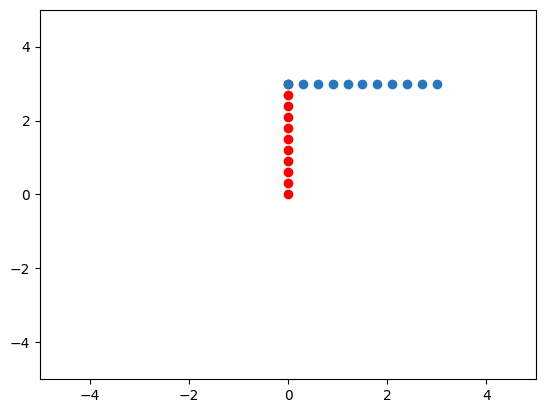

In [ ]:
__doc__ = """Fixed joint example, for detailed explanation refer to Zhang et. al. Nature Comm.  methods section."""

import numpy as np
import elastica as ea


class FixedJointSimulator(
    ea.BaseSystemCollection,
    ea.Constraints,
    ea.Connections,
    ea.Forcing,
    ea.Damping,
    ea.CallBacks,
):
    pass


fixed_joint_sim = FixedJointSimulator()

# setting up test params
n_elem = 10
direction = np.array([0.0, 0.0, 1.0])
normal = np.array([0.0, 1.0, 0.0])
direction2 = np.array([1.0, 0.0, 0.0])
normal2 = np.array([0.0, 1.0, 0.0])
roll_direction = np.cross(direction, normal)
base_length = 3
base_radius = 0.007
base_area = np.pi * base_radius ** 2
density = 1750
E = 3e7
poisson_ratio = 0.5
shear_modulus = E / (poisson_ratio + 1.0)

start_rod_1 = np.zeros((3,))
start_rod_2 = start_rod_1 + direction * base_length

# Create rod 1
rod1 = ea.CosseratRod.straight_rod(
    n_elem,
    start_rod_1,
    direction,
    normal,
    base_length,
    base_radius,
    density,
    youngs_modulus=E,
    shear_modulus=shear_modulus,
)
fixed_joint_sim.append(rod1)
# Create rod 2
rod2 = ea.CosseratRod.straight_rod(
    n_elem,
    start_rod_2,
    direction2,
    normal2,
    base_length,
    base_radius,
    density,
    youngs_modulus=E,
    shear_modulus=shear_modulus,
)
fixed_joint_sim.append(rod2)

# Apply boundary conditions to rod1.
fixed_joint_sim.constrain(rod1).using(
    ea.OneEndFixedBC, constrained_position_idx=(0,), constrained_director_idx=(0,)
)

# Connect rod 1 and rod 2
# fixed_joint_sim.connect(
#     first_rod=rod1, second_rod=rod2, first_connect_idx=-1, second_connect_idx=5
# ).using(ea.FixedJoint, k=1e5, nu=0.0, kt=1e1, nut=0.0)

# Add forces to rod2
# fixed_joint_sim.add_forcing_to(rod2).using(
#     ea.EndpointForcesSinusoidal,
#     start_force_mag=5e-3,
#     end_force_mag=5e-3,
#     ramp_up_time=0.2,
#     tangent_direction=direction,
#     normal_direction=normal,
# )

# end_force = np.array([0.0, -0.05, 0.0])

# fixed_joint_sim.add_forcing_to(rod2).using(
#     ea.UniformForces,
#     force = -0.5,
#     direction= np.array([0., 0., -1.])
# )

# add damping
damping_constant = 0.4
dt = 1e-4
fixed_joint_sim.dampen(rod1).using(
    ea.AnalyticalLinearDamper,
    damping_constant=damping_constant,
    time_step=dt,
)
fixed_joint_sim.dampen(rod2).using(
    ea.AnalyticalLinearDamper,
    damping_constant=damping_constant,
    time_step=dt,
)

pp_list_rod1 = ea.defaultdict(list)
pp_list_rod2 = ea.defaultdict(list)

fixed_joint_sim.collect_diagnostics(rod1).using(
    ea.MyCallBack, step_skip=1000, callback_params=pp_list_rod1
)
fixed_joint_sim.collect_diagnostics(rod2).using(
    ea.MyCallBack, step_skip=1000, callback_params=pp_list_rod2
)

fixed_joint_sim.finalize()
timestepper = ea.PositionVerlet()
# timestepper = PEFRL()

final_time = 10
dl = base_length / n_elem
total_steps = int(final_time / dt)
print("Total steps", total_steps)
ea.integrate(timestepper, fixed_joint_sim, final_time, total_steps)

PLOT_FIGURE = True
SAVE_FIGURE = False
PLOT_VIDEO = True

# plotting results
if PLOT_FIGURE:
    filename = "fixed_joint_test.png"
    plot_position(pp_list_rod1, pp_list_rod2, filename, SAVE_FIGURE)

if PLOT_VIDEO:
    filename = "fixed_joint_test.mp4"
    plot_video(pp_list_rod1, pp_list_rod2, video_name=filename, margin=0.2, fps=100)
    plot_video_xy(
        pp_list_rod1, pp_list_rod2, video_name=filename + "_xy.mp4", margin=0.2, fps=100
    )
    plot_video_xz(
        pp_list_rod1, pp_list_rod2, video_name=filename + "_xz.mp4", margin=0.2, fps=100
    )

In [ ]:
pp_list_rod1

defaultdict(list,
            {'time': [0.0,
              0.09999999999999715,
              0.19999999999998613,
              0.2999999999999751,
              0.3999999999999641,
              0.4999999999999531,
              0.5999999999999421,
              0.6999999999999311,
              0.7999999999999201,
              0.8999999999999091,
              0.9999999999998981,
              1.1000000000001091,
              1.2000000000003201,
              1.3000000000005312,
              1.4000000000007422,
              1.5000000000009532,
              1.6000000000011643,
              1.7000000000013753,
              1.8000000000015863,
              1.9000000000017974,
              2.000000000002008,
              2.100000000001775,
              2.200000000001542,
              2.300000000001309,
              2.400000000001076,
              2.500000000000843,
              2.60000000000061,
              2.7000000000003768,
              2.8000000000001437,
         

# Aarish doing more weird things

In [ ]:
import numpy as np


class AnalyticalDynamicCantilever:
    """
    This class computes the analytical solution to a cantilever's dynamic response
    to an initial velocity profile based on the Euler-Bernoulli beam theory.

    Given the generic dynamic beam equation and boundary conditions imposed on a cantilever,
    nontrivial solutions exist only when

        cosh(beta * base_length) * cos(beta * base_length) + 1 = 0

    where beta can be used to determine the natural frequencies of the cantilever beam:

        omega = beta^2 * sqrt(E * I / mu)

    The first four roots to beta are given as

        betas = [0.596864*pi, 1.49418*pi, 2.50025*pi, 3.49999*pi] / base_length

    The class solves for the analytical solution at a single natural frequency by computing
    the non-parametrized mode shapes as well as a mode parameter. The parameter is determined
    by the initial condition of the rod, namely, the end_velocity input. The free vibration
    equation can then be applied to determine beam deflection at a given time at any position
    of the rod:

        w(x, t) = Re[mode_shape * exp(-1j * omega * t)]

    For details, refer to
    https://en.wikipedia.org/wiki/Euler%E2%80%93Bernoulli_beam_theory#Dynamic_beam_equation
    or
    Han et al (1998), Dynamics of Transversely Vibrating Beams
    Using Four Engineering Theories

        Attributes
        ----------
        base_length: float
            Total length of the rod
        base_area: float
            Cross-sectional area of the rod
        moment_of_inertia: float
            Second moment of area of the rod's cross-section
        young's_modulus: float
            Young's modulus of the rod
        density: float
            Density of the rod
        mode: int
            Index of the first 'mode' th natural frequency.
            Up to the first four modes are supported.
        end_velocity: float
            Initial oscillatory velocity at the end of the rod
    """

    def __init__(
        self,
        base_length,
        base_area,
        moment_of_inertia,
        youngs_modulus,
        density,
        mode,
        end_velocity=0.0,
    ):
        self.base_length = base_length
        self.end_velocity = end_velocity

        if not (isinstance(mode, int) and mode >= 0 and mode < 5):
            raise ValueError(
                "Unsupported mode value, please provide a integer value from 0-4"
            )

        self.mode = mode

        betas = np.array([0.596864, 1.49418, 2.50025, 3.49999]) * np.pi / base_length
        self.beta = betas[mode]
        self.omega = (self.beta ** 2) * np.sqrt(
            youngs_modulus
            * moment_of_inertia
            / (density * base_area * base_length ** 4)
        )

        nonparametrized_mode_at_end = self._compute_nonparametrized_mode(
            base_length, base_length, self.beta
        )
        self.mode_param = end_velocity / (
            -1j * self.omega * nonparametrized_mode_at_end
        )

    def get_initial_velocity_profile(self, positions):
        initial_velocities = []

        for x in positions:
            initial_velocities.append(
                np.real(
                    (-1j * self.omega * self.mode_param)
                    * self._compute_nonparametrized_mode(
                        self.base_length * x, self.base_length, self.beta
                    )
                )
            )
        return np.array(initial_velocities)

    def get_time_dependent_positions(self, position, time_array):
        time_dependent_positions = (
            self.mode_param
            * self._compute_nonparametrized_mode(
                self.base_length * position, self.base_length, self.beta
            )
            * np.exp(-1j * self.omega * time_array)
        )
        return np.real(time_dependent_positions)

    def get_time_dependent_velocities(self, position, time_array):
        time_dependent_velocities = (
            (-1j * self.omega * self.mode_param)
            * self._compute_nonparametrized_mode(
                self.base_length * position, self.base_length, self.beta
            )
            * np.exp(-1j * self.omega * time_array)
        )
        return np.real(time_dependent_velocities)

    def get_omega(self):
        return self.omega

    def get_amplitude(self):
        return self.end_velocity / self.omega

    @staticmethod
    def _compute_nonparametrized_mode(x, base_length, beta):
        a = np.cosh(beta * x) - np.cos(beta * x)
        b = np.cos(beta * base_length) + np.cosh(beta * base_length)
        c = np.sin(beta * base_length) + np.sinh(beta * base_length)
        d = np.sin(beta * x) - np.sinh(beta * x)
        return a + b / c * d

In [ ]:
pip install numpy==1.22

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 24.3 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.22.4
    Uninstalling numpy-1.22.4:
      Successfully uninstalled numpy-1.22.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.
librosa 0.10.1 requires numpy!=1.22.0,!=1.22.1,!=1.22.2,>=1.20.3, but you have numpy 1.22.0 which is incompatible.
plotnine 0.12.4 requires numpy>=1.23.0, but you have numpy 1.22.0 which is incompatible.
tensorflow 2.14.0 requires numpy>=1.23.5, but you have numpy 1.22.0 which is incompatible.


In [ ]:
import matplotlib.pyplot as plt
import numpy as np


# Plotting frequency and amplitudes against densities
def plot_phase_space_with(
    densities,
    theory_frequency,
    sim_frequency,
    theory_amplitude,
    sim_amplitude,
    PLOT_FIGURE=True,
    SAVE_FIGURE=False,
):

    fig = plt.figure(figsize=(20, 8), frameon=True, dpi=150)

    ax_freq = fig.add_subplot(121)
    ax_freq.grid(which="both", color="k", linestyle="-")
    ax_freq.plot(
        densities,
        theory_frequency,
        color="k",
        marker="o",
        ms=8,
        lw=2,
        label="theoretical_frequency",
    )
    ax_freq.plot(
        densities,
        sim_frequency,
        color="r",
        marker="o",
        ms=8,
        lw=2,
        label="simulated_frequency",
    )
    ax_freq.set_ylim([0, 0.6])
    ax_freq.set_xlabel(r"Density [$kg/m^3$]")
    ax_freq.set_ylabel(r"Frequency [$rad/s$]")
    ax_freq.legend()

    ax_amp = fig.add_subplot(122)
    ax_amp.grid(visible=True, which="both", color="k", linestyle="-")
    ax_amp.plot(
        densities,
        theory_amplitude,
        color="k",
        marker="o",
        ms=8,
        lw=2,
        label="theoretical_amplitude",
    )
    ax_amp.plot(
        densities,
        sim_amplitude,
        color="r",
        marker="o",
        ms=8,
        lw=2,
        label="simulated_amplitude",
    )
    ax_amp.set_ylim([0, 0.05])
    ax_amp.set_xlabel(r"Density [$kg/m^3$]")
    ax_amp.set_ylabel(r"Amplitude [$m$]")
    ax_amp.legend()

    if PLOT_FIGURE:
        plt.show()

    if SAVE_FIGURE:
        fig.savefig("Dynamic_cantilever_phase_plot.png")


def plot_end_position_with(
    recorded_history,
    analytical_cantilever_soln,
    omegas,
    amplitudes,
    peak,
    PLOT_FIGURE,
    SAVE_FIGURE,
):
    fig = plt.figure(figsize=(20, 8), frameon=True, dpi=150)
    ax = fig.add_subplot(121)
    ax.plot(
        recorded_history["time"],
        recorded_history["deflection"],
        lw=2.0,
        label="Cosserat rod model",
    )
    ax.set_xlabel("Time [s]", fontsize=16)
    ax.set_ylabel("Displacement [m]", fontsize=16)
    ax.grid(which="both", color="k", linestyle="--")

    time = np.array(recorded_history["time"])
    positions = analytical_cantilever_soln.get_time_dependent_positions(1, time)

    ax.plot(time, positions, lw=2.0, label="Euler-Bernoulli beam theory")
    ax.legend()

    # FFT plot
    fft_ax = fig.add_subplot(122)
    fft_ax.plot(omegas, amplitudes, lw=2, color="k")
    fft_ax.set_xlim([0, analytical_cantilever_soln.get_omega() * 2])

    fft_ax.set_xlabel("Frequency [rad/s]", fontsize=16)
    fft_ax.set_ylabel("Amplitude [m]", fontsize=16)

    fft_ax.plot(omegas[peak], amplitudes[peak], "*", color="red", ms=8)

    if PLOT_FIGURE:
        plt.show()

    if SAVE_FIGURE:
        fig.savefig("Dynamic_cantilever_visualization.png")


def plot_dynamic_cantilever_video_with(
    mode,
    recorded_history,
    rendering_fps,
):
    print("Plotting video ...")
    video_name = f"Dynamic_cantilever_mode_{mode + 1}.mp4"

    import matplotlib.animation as manimation
    from tqdm import tqdm

    positions_over_time = np.array(recorded_history["position"])

    FFMpegWriter = manimation.writers["ffmpeg"]
    metadata = dict(title="Movie Test", artist="Matplotlib", comment="Movie support!")
    writer = FFMpegWriter(fps=rendering_fps, metadata=metadata)
    mvfig = plt.figure(figsize=(10, 8), frameon=True, dpi=150)
    ax = mvfig.add_subplot(111)
    ax.set_xlim([0, 1.25])
    ax.set_ylim([-0.02, 0.02])
    ax.set_xlabel("x [m]", fontsize=16)
    ax.set_ylabel("z [m]", fontsize=16)
    rod_lines_2d = ax.plot(
        positions_over_time[0][0], positions_over_time[0][2], lw=8, color="k"
    )[0]

    with writer.saving(mvfig, video_name, dpi=150):
        for t in tqdm(range(1, len(recorded_history["time"]))):
            rod_lines_2d.set_xdata(positions_over_time[t][0])
            rod_lines_2d.set_ydata(positions_over_time[t][2])
            writer.grab_frame()

    plt.close(plt.gcf())

In [ ]:
from scipy.fft import fft, fftfreq
from scipy.signal import find_peaks
import elastica as ea

def simulate_dynamic_cantilever_with(
    density=2000.0,
    n_elem=100,
    final_time=300.0,
    mode=0,
    rendering_fps=30.0,  # For visualization
):
    """
    This function completes a dynamic cantilever simulation with the given parameters.

    Parameters
    ----------
    density: float
        Density of the rod
    n_elem: int
        The number of elements of the rod
    final_time: float
        Total simulation time. The timestep is determined by final_time / n_steps.
    mode: int
        Index of the first 'mode' th natural frequency.
        Up to the first four modes are supported.
    rendering_fps: float
        Frames per second for video plotting.
        The call back step-skip is also determined by rendering_fps.

    Returns
    -------
    dict of {str : int}
        A collection of parameters for post-processing.

    """

    class DynamicCantileverSimulator(
        ea.BaseSystemCollection, ea.Constraints, ea.CallBacks
    ):
        pass

    cantilever_sim = DynamicCantileverSimulator()

    # Add test parameters
    start = np.zeros((3,))
    direction = np.array([1.0, 0.0, 0.0])
    normal = np.array([0.0, 1.0, 0.0])
    base_length = 1
    base_radius = 0.02
    base_area = np.pi * base_radius ** 2
    youngs_modulus = 1e5

    moment_of_inertia = np.pi / 4 * base_radius ** 4

    dl = base_length / n_elem
    dt = dl * 0.05
    step_skips = int(1.0 / (rendering_fps * dt))

    # Add Cosserat rod
    cantilever_rod = ea.CosseratRod.straight_rod(
        n_elem,
        start,
        direction,
        normal,
        base_length,
        base_radius,
        density,
        youngs_modulus=youngs_modulus,
    )

    # Add constraints
    cantilever_sim.append(cantilever_rod)
    cantilever_sim.constrain(cantilever_rod).using(
        ea.OneEndFixedBC, constrained_position_idx=(0,), constrained_director_idx=(0,)
    )

    end_velocity = 0.005
    analytical_cantilever_soln = AnalyticalDynamicCantilever(
        base_length,
        base_area,
        moment_of_inertia,
        youngs_modulus,
        density,
        mode=mode,
        end_velocity=end_velocity,
    )

    initial_velocity = analytical_cantilever_soln.get_initial_velocity_profile(
        cantilever_rod.position_collection[0, :]
    )
    cantilever_rod.velocity_collection[2, :] = initial_velocity

    # Add call backs
    class CantileverCallBack(ea.CallBackBaseClass):
        def __init__(self, step_skip: int, callback_params: dict):
            ea.CallBackBaseClass.__init__(self)
            self.every = step_skip
            self.callback_params = callback_params

        def make_callback(self, system, time, current_step: int):

            if current_step % self.every == 0:

                self.callback_params["time"].append(time)
                self.callback_params["position"].append(
                    system.position_collection.copy()
                )
                self.callback_params["deflection"].append(
                    system.position_collection[2, -1].copy()
                )
                return

    recorded_history = ea.defaultdict(list)
    cantilever_sim.collect_diagnostics(cantilever_rod).using(
        CantileverCallBack, step_skip=step_skips, callback_params=recorded_history
    )
    cantilever_sim.finalize()

    total_steps = int(final_time / dt)
    print(f"Total steps: {total_steps}")

    timestepper = ea.PositionVerlet()

    ea.integrate(
        timestepper,
        cantilever_sim,
        final_time,
        total_steps,
    )

    # FFT
    amplitudes = np.abs(fft(recorded_history["deflection"]))
    fft_length = len(amplitudes)
    amplitudes = amplitudes * 2 / fft_length
    omegas = fftfreq(fft_length, dt * step_skips) * 2 * np.pi  # [rad/s]

    try:
        peaks, _ = find_peaks(amplitudes)
        peak = peaks[np.argmax(amplitudes[peaks])]

        simulated_frequency = omegas[peak]
        theoretical_frequency = analytical_cantilever_soln.get_omega()

        simulated_amplitude = max(recorded_history["deflection"])
        theoretical_amplitude = analytical_cantilever_soln.get_amplitude()

        print(
            f"Theoretical frequency: {theoretical_frequency} rad/s \n"
            f"Simulated frequency: {simulated_frequency} rad/s \n"
            f"Theoretical amplitude: {theoretical_amplitude} m \n"
            f"Simulated amplitude: {simulated_amplitude} m"
        )

        return {
            "rod": cantilever_rod,
            "recorded_history": recorded_history,
            "fft_frequencies": omegas,
            "fft_amplitudes": amplitudes,
            "analytical_cantilever_soln": analytical_cantilever_soln,
            "peak": peak,
            "simulated_frequency": simulated_frequency,
            "theoretical_frequency": theoretical_frequency,
            "simulated_amplitude": simulated_amplitude,
            "theoretical_amplitude": theoretical_amplitude,
        }

    except RuntimeError:
        print("No peaks detected: change input parameters.")

In [ ]:
import multiprocessing as mp

PLOT_FIGURE = True
SAVE_FIGURE = False

# density = 500, 1000, 2000, 3000, 4000, 5000 kg/m3
densities = [500]
densities.extend(range(1000, 6000, 1000))

with mp.Pool(mp.cpu_count()) as pool:
    results = pool.map(simulate_dynamic_cantilever_with, densities)

theory_frequency = []
sim_frequency = []
theory_amplitude = []
sim_amplitude = []

for result in results:
    theory_frequency.append(result["theoretical_frequency"])
    sim_frequency.append(result["simulated_frequency"])
    theory_amplitude.append(result["theoretical_amplitude"])
    sim_amplitude.append(result["simulated_amplitude"])

# Plot frequencies and amplitudes vs densities
plot_phase_space_with(
    densities,
    theory_frequency,
    sim_frequency,
    theory_amplitude,
    sim_amplitude,
    PLOT_FIGURE=PLOT_FIGURE,
    SAVE_FIGURE=SAVE_FIGURE,
)

Total steps: 600000
Total steps: 600000


In [ ]:
simulate_dynamic_cantilever_with()

Total steps: 600000


100%|██████████| 600000/600000 [01:49<00:00, 5457.13it/s]


Final time of simulation is :  299.9999999946339
Theoretical frequency: 0.24861968837259707 rad/s 
Simulated frequency: 0.2513248990381931 rad/s 
Theoretical amplitude: 0.020111037998353076 m 
Simulated amplitude: 0.01997364288580491 m


{'rod': <elastica.rod.cosserat_rod.CosseratRod at 0x7d6ac26d38e0>,
 'recorded_history': defaultdict(list,
             {'time': [0.0,
               0.03300000000000002,
               0.06600000000000004,
               0.09900000000000007,
               0.1320000000000001,
               0.16500000000000012,
               0.19800000000000015,
               0.23100000000000018,
               0.2639999999999986,
               0.296999999999995,
               0.32999999999999136,
               0.3629999999999877,
               0.3959999999999841,
               0.42899999999998045,
               0.4619999999999768,
               0.4949999999999732,
               0.5279999999999696,
               0.560999999999966,
               0.5939999999999623,
               0.6269999999999587,
               0.6599999999999551,
               0.6929999999999514,
               0.7259999999999478,
               0.7589999999999442,
               0.7919999999999405,
               0.824

# Yuree doing crazy things

Total steps 100000


100%|██████████| 100000/100000 [00:17<00:00, 5560.55it/s]


Final time of simulation is :  9.999999999983364


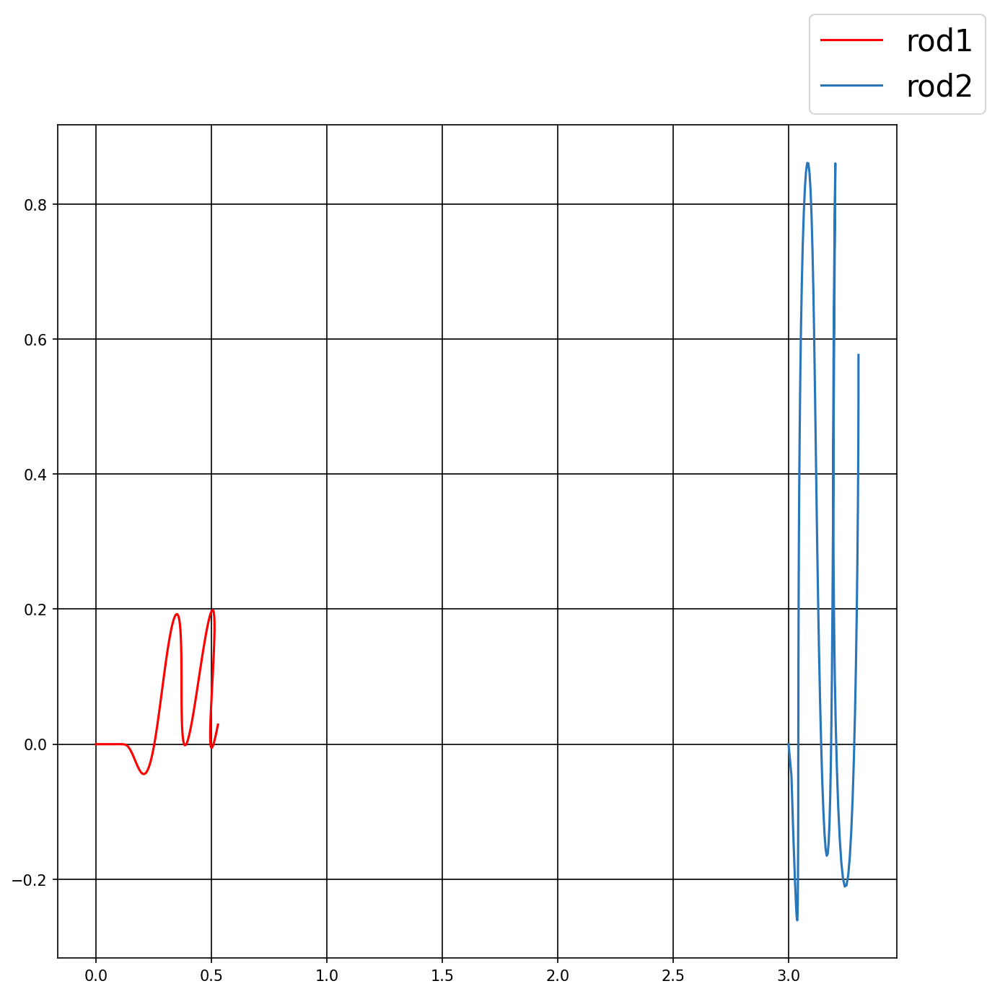

plot video
plot video xy
plot video xz


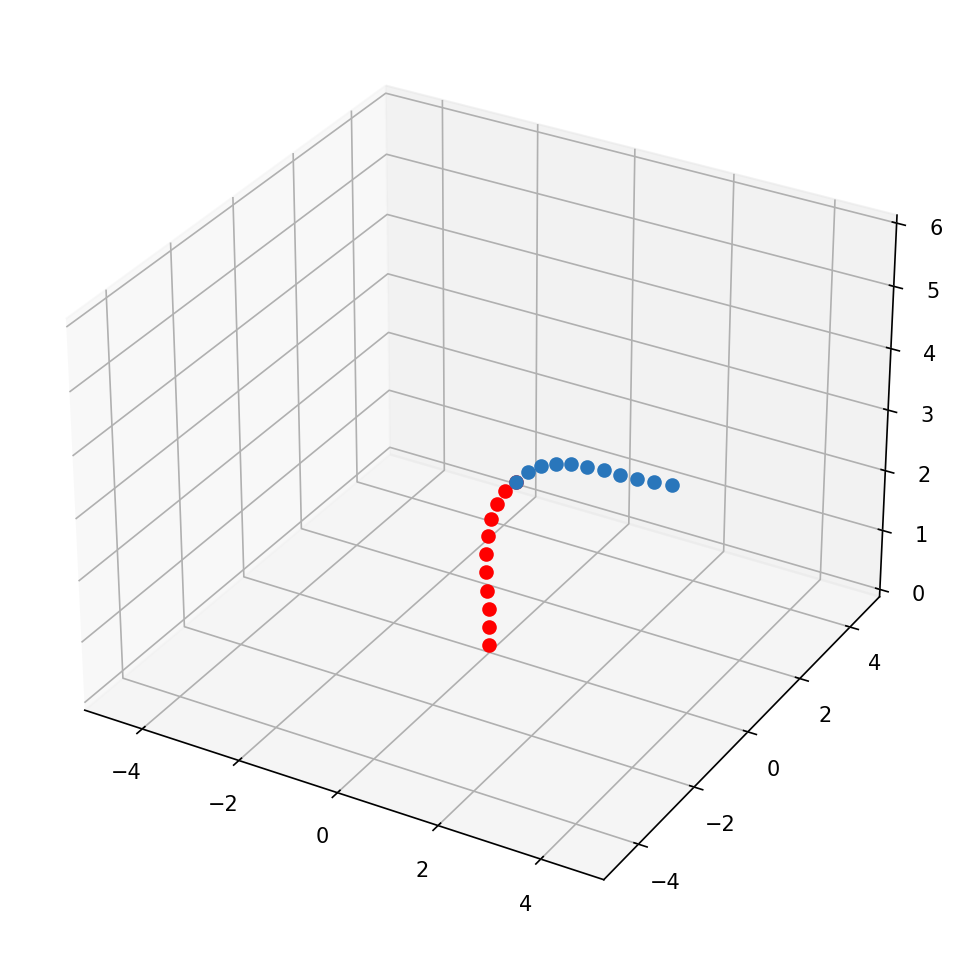

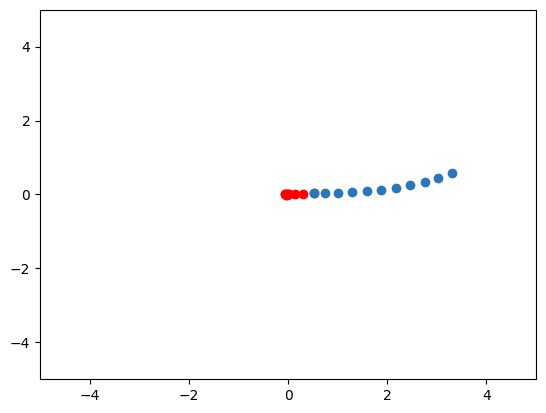

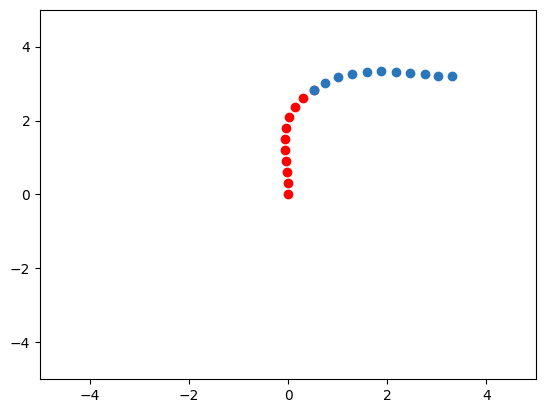

In [ ]:
__doc__ = """Fixed joint example, for detailed explanation refer to Zhang et. al. Nature Comm.  methods section."""

import numpy as np
import elastica as ea
from numpy import cos, sin, pi


class FixedJointSimulator(
    ea.BaseSystemCollection,
    ea.Constraints,
    ea.Connections,
    ea.Forcing,
    ea.Damping,
    ea.CallBacks,
):
    pass


fixed_joint_sim = FixedJointSimulator()

# setting up test params
n_elem = 10
direction1 = np.array([0.0, 0.0, 1.0])
direction2 = np.array([1.0, 0.0, 0.0])
normal1 = np.array([0.0, 1.0, 0.0])
normal2 = np.array([0.0, 1.0, 0.0])
roll_direction = np.cross(direction1, normal1)
roll_direction2 = np.cross(direction2, normal2)
base_length = 3
base_radius = 0.007
base_area = np.pi * base_radius ** 2
density = 1750
E = 3e7
poisson_ratio = 0.5
shear_modulus = E / (poisson_ratio + 1.0)

start_rod_1 = np.zeros((3,))
start_rod_2 = start_rod_1 + direction1 * base_length

# Rod 1
rod1 = ea.CosseratRod.straight_rod(
    n_elem,
    start_rod_1,
    direction1,
    normal1,
    base_length,
    base_radius,
    density,
    youngs_modulus=E,
    shear_modulus=shear_modulus,
)
fixed_joint_sim.append(rod1)

# Rod 2
rod2 = ea.CosseratRod.straight_rod(
    n_elem,
    start_rod_2,
    direction2,
    normal2,
    base_length,
    base_radius,
    density,
    youngs_modulus=E,
    shear_modulus=shear_modulus,
)
fixed_joint_sim.append(rod2)

# Apply boundary conditions to rod1.
fixed_joint_sim.constrain(rod1).using(
    ea.OneEndFixedBC, constrained_position_idx=(0,), constrained_director_idx=(0,)
)

# Connect rod 1 and rod 2
fixed_joint_sim.connect(
    first_rod=rod1, second_rod=rod2, first_connect_idx=-1, second_connect_idx=0 # 5
).using(ea.FixedJoint, k=1e5, nu=0.0, kt=1e1, nut=0.0)


# Add forces to Rod 2
fixed_joint_sim.add_forcing_to(rod2).using(
    ea.EndpointForcesSinusoidal,
    start_force_mag=0,
    end_force_mag=5e-1,
    ramp_up_time=0.2,
    tangent_direction=direction2, # direction1
    normal_direction=normal2, # normal1
)

# add damping
damping_constant = 0.4
dt = 1e-4
fixed_joint_sim.dampen(rod1).using(
    ea.AnalyticalLinearDamper,
    damping_constant=damping_constant,
    time_step=dt,
)
fixed_joint_sim.dampen(rod2).using(
    ea.AnalyticalLinearDamper,
    damping_constant=damping_constant,
    time_step=dt,
)


pp_list_rod1 = ea.defaultdict(list)
pp_list_rod2 = ea.defaultdict(list)

fixed_joint_sim.collect_diagnostics(rod1).using(
    ea.MyCallBack, step_skip=1000, callback_params=pp_list_rod1
)
fixed_joint_sim.collect_diagnostics(rod2).using(
    ea.MyCallBack, step_skip=1000, callback_params=pp_list_rod2
)

fixed_joint_sim.finalize()
timestepper = ea.PositionVerlet()
# timestepper = PEFRL()

final_time = 10
dl = base_length / n_elem
total_steps = int(final_time / dt)
print("Total steps", total_steps)
ea.integrate(timestepper, fixed_joint_sim, final_time, total_steps)

PLOT_FIGURE = True
SAVE_FIGURE = False
PLOT_VIDEO = True

# plotting results
if PLOT_FIGURE:
    filename = "fixed_joint_test.png"
    plot_position(pp_list_rod1, pp_list_rod2, filename, SAVE_FIGURE)

if PLOT_VIDEO:
    filename = "fixed_joint_test.mp4"
    plot_video(pp_list_rod1, pp_list_rod2, video_name=filename, margin=0.2, fps=100)
    plot_video_xy(
        pp_list_rod1, pp_list_rod2, video_name=filename + "_xy.mp4", margin=0.2, fps=100
    )
    plot_video_xz(
        pp_list_rod1, pp_list_rod2, video_name=filename + "_xz.mp4", margin=0.2, fps=100
    )

# Aarish and Yuree going bonkers

To do:

- Simulate Timoshenko (Aarish) **DONE** :)

- Find inertia values for a common I-beam (Yuree) **DONE**

- Find correction factor (alpha_c) for I-beam (Aarish) **DONE** :)

- Change bend and shear matrices (Aarish) **DONE** :)

- Endpoint sinusoidal force input (Diane) **DONE**

- Test!

Goal: Friday, 12/1/2023

To do:

1) Test! Manual optimization of processes (Diane)

Find forces to apply, length of I-beam (constant), constraints for height and width of the I-beam, implement steel material properties for shear and youngs modulus + other properties

Max force:

Optimal length (within the constraints of being able to run our simulation):

Max width:

Max height:

Steel properties:

Experiment with different heights and widths once all other properties are configured (manual implementaton of our CMA)

Goal: Finish by Sunday (12/3)

2) Implement CMA (Yuree + Aarish + maybe Diane?)

Goal: Finish by Sunday (12/3)

To do:

1) Presentation

Goal: Finish by Monday (12/4)

In [ ]:
pip install numpy==1.22

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.colors import to_rgb
import elastica as ea
from elastica.typing import SystemType, RodType
from numba import njit

In [ ]:
import numpy as np


class AnalyticalDynamicCantilever:
    """
    This class computes the analytical solution to a cantilever's dynamic response
    to an initial velocity profile based on the Euler-Bernoulli beam theory.

    Given the generic dynamic beam equation and boundary conditions imposed on a cantilever,
    nontrivial solutions exist only when

        cosh(beta * base_length) * cos(beta * base_length) + 1 = 0

    where beta can be used to determine the natural frequencies of the cantilever beam:

        omega = beta^2 * sqrt(E * I / mu)

    The first four roots to beta are given as

        betas = [0.596864*pi, 1.49418*pi, 2.50025*pi, 3.49999*pi] / base_length

    The class solves for the analytical solution at a single natural frequency by computing
    the non-parametrized mode shapes as well as a mode parameter. The parameter is determined
    by the initial condition of the rod, namely, the end_velocity input. The free vibration
    equation can then be applied to determine beam deflection at a given time at any position
    of the rod:

        w(x, t) = Re[mode_shape * exp(-1j * omega * t)]

    For details, refer to
    https://en.wikipedia.org/wiki/Euler%E2%80%93Bernoulli_beam_theory#Dynamic_beam_equation
    or
    Han et al (1998), Dynamics of Transversely Vibrating Beams
    Using Four Engineering Theories

        Attributes
        ----------
        base_length: float
            Total length of the rod
        base_area: float
            Cross-sectional area of the rod
        moment_of_inertia: float
            Second moment of area of the rod's cross-section
        young's_modulus: float
            Young's modulus of the rod
        density: float
            Density of the rod
        mode: int
            Index of the first 'mode' th natural frequency.
            Up to the first four modes are supported.
        end_velocity: float
            Initial oscillatory velocity at the end of the rod
    """

    def __init__(
        self,
        base_length,
        base_area,
        moment_of_inertia,
        youngs_modulus,
        density,
        mode,
        end_velocity=0.0,
    ):
        self.base_length = base_length
        self.end_velocity = end_velocity

        if not (isinstance(mode, int) and mode >= 0 and mode < 5):
            raise ValueError(
                "Unsupported mode value, please provide a integer value from 0-4"
            )

        self.mode = mode

        betas = np.array([0.596864, 1.49418, 2.50025, 3.49999]) * np.pi / base_length
        self.beta = betas[mode]
        self.omega = (self.beta ** 2) * np.sqrt(
            youngs_modulus
            * moment_of_inertia
            / (density * base_area * base_length ** 4)
        )

        nonparametrized_mode_at_end = self._compute_nonparametrized_mode(
            base_length, base_length, self.beta
        )
        self.mode_param = end_velocity / (
            -1j * self.omega * nonparametrized_mode_at_end
        )

    def get_initial_velocity_profile(self, positions):
        initial_velocities = []

        for x in positions:
            initial_velocities.append(
                np.real(
                    (-1j * self.omega * self.mode_param)
                    * self._compute_nonparametrized_mode(
                        self.base_length * x, self.base_length, self.beta
                    )
                )
            )
        return np.array(initial_velocities)

    def get_time_dependent_positions(self, position, time_array):
        time_dependent_positions = (
            self.mode_param
            * self._compute_nonparametrized_mode(
                self.base_length * position, self.base_length, self.beta
            )
            * np.exp(-1j * self.omega * time_array)
        )
        return np.real(time_dependent_positions)

    def get_time_dependent_velocities(self, position, time_array):
        time_dependent_velocities = (
            (-1j * self.omega * self.mode_param)
            * self._compute_nonparametrized_mode(
                self.base_length * position, self.base_length, self.beta
            )
            * np.exp(-1j * self.omega * time_array)
        )
        return np.real(time_dependent_velocities)

    def get_omega(self):
        return self.omega

    def get_amplitude(self):
        return self.end_velocity / self.omega

    @staticmethod
    def _compute_nonparametrized_mode(x, base_length, beta):
        a = np.cosh(beta * x) - np.cos(beta * x)
        b = np.cos(beta * base_length) + np.cosh(beta * base_length)
        c = np.sin(beta * base_length) + np.sinh(beta * base_length)
        d = np.sin(beta * x) - np.sinh(beta * x)
        return a + b / c * d

In [ ]:
class EndpointForces(ea.external_forces.NoForces):
    """
    This class applies constant forces on the endpoint nodes.

        Attributes
        ----------
        start_force: numpy.ndarray
            1D (dim) array containing data with 'float' type. Force applied to first node of the system.
        end_force: numpy.ndarray
            1D (dim) array containing data with 'float' type. Force applied to last node of the system.
        ramp_up_time: float
            Applied forces are ramped up until ramp up time.

    """

    def __init__(self, start_force, end_force, ramp_up_time):
        """

        Parameters
        ----------
        start_force: numpy.ndarray
            1D (dim) array containing data with 'float' type.
            Force applied to first node of the system.
        end_force: numpy.ndarray
            1D (dim) array containing data with 'float' type.
            Force applied to last node of the system.
        ramp_up_time: float
            Applied forces are ramped up until ramp up time.

        """
        super(EndpointForces, self).__init__()
        self.start_force = start_force
        self.end_force = end_force
        assert ramp_up_time > 0.0
        self.ramp_up_time = ramp_up_time


    def apply_forces(self, system: SystemType, time=0.0):
        self.compute_end_point_forces(
            system.external_forces,
            self.start_force,
            self.end_force,
            time,
            self.ramp_up_time,
        )

    @staticmethod
    @njit(cache=True)
    def compute_end_point_forces(
        external_forces, start_force, end_force, time, ramp_up_time
    ):
        """
        Compute end point forces that are applied on the rod using numba njit decorator.

        Parameters
        ----------
        external_forces: numpy.ndarray
            2D (dim, blocksize) array containing data with 'float' type. External force vector.
        start_force: numpy.ndarray
            1D (dim) array containing data with 'float' type.
        end_force: numpy.ndarray
            1D (dim) array containing data with 'float' type.
            Force applied to last node of the system.
        time: float
        ramp_up_time: float
            Applied forces are ramped up until ramp up time.

        Returns
        -------

        """
        factor = min(1.0, time / ramp_up_time)
        external_forces[..., 0] += start_force * factor
        external_forces[..., -1] += end_force * factor

In [ ]:
class EndpointForcesSin(ea.external_forces.NoForces):
    """
    This class applies constant forces on the endpoint nodes.

        Attributes
        ----------
        start_force: numpy.ndarray
            1D (dim) array containing data with 'float' type. Force applied to first node of the system.
        end_force: numpy.ndarray
            1D (dim) array containing data with 'float' type. Force applied to last node of the system.
        ramp_up_time: float
            Applied forces are ramped up until ramp up time.

    """

    def __init__(self, start_force, end_force, ramp_up_time):
        """

        Parameters
        ----------
        start_force: numpy.ndarray
            1D (dim) array containing data with 'float' type.
            Force applied to first node of the system.
        end_force: numpy.ndarray
            1D (dim) array containing data with 'float' type.
            Force applied to last node of the system.
        ramp_up_time: float
            Applied forces are ramped up until ramp up time.

        """
        super(EndpointForcesSin, self).__init__()
        self.start_force = start_force
        self.end_force = end_force
        assert ramp_up_time > 0.0
        self.ramp_up_time = ramp_up_time


    def apply_forces(self, system: SystemType, time=0.0):
        self.compute_end_point_forces(
            system.external_forces,
            self.start_force,
            self.end_force,
            time,
            self.ramp_up_time,
        )

    @staticmethod
    @njit(cache=True)
    def compute_end_point_forces(
        external_forces, start_force, end_force, time, ramp_up_time
    ):
        """
        Compute end point forces that are applied on the rod using numba njit decorator.

        Parameters
        ----------
        external_forces: numpy.ndarray
            2D (dim, blocksize) array containing data with 'float' type. External force vector.
        start_force: numpy.ndarray
            1D (dim) array containing data with 'float' type.
        end_force: numpy.ndarray
            1D (dim) array containing data with 'float' type.
            Force applied to last node of the system.
        time: float
        ramp_up_time: float
            Applied forces are ramped up until ramp up time.

        Returns
        -------

        """
        w = 0.5 #omega present in sinusoidal function

        factor = min(1.0, time / ramp_up_time)
        external_forces[..., 0] += start_force * factor * np.sin(w*time)
        external_forces[..., -1] += end_force * factor * np.sin(w*time)

In [ ]:
def analytical_shearable(arg_rod, arg_end_force, n_elem=500):
    base_length = np.sum(arg_rod.rest_lengths)
    arg_s = np.linspace(0.0, base_length, n_elem)
    if type(arg_end_force) is np.ndarray:
        acting_force = arg_end_force[np.nonzero(arg_end_force)]
    else:
        acting_force = arg_end_force
    acting_force = np.abs(acting_force)

    linear_prefactor = -acting_force / arg_rod.shear_matrix[0, 0, 0]
    quadratic_prefactor = (
        -acting_force
        * np.sum(arg_rod.rest_lengths)
        / 2.0
        / arg_rod.bend_matrix[0, 0, 0]
    )
    cubic_prefactor = acting_force / 6.0 / arg_rod.bend_matrix[0, 0, 0]
    return (
        arg_s,
        arg_s
        * (linear_prefactor + arg_s * (quadratic_prefactor + arg_s * cubic_prefactor)),
    )


def analytical_unshearable(arg_rod, arg_end_force, n_elem=500):
    base_length = np.sum(arg_rod.rest_lengths)
    arg_s = np.linspace(0.0, base_length, n_elem)
    if type(arg_end_force) is np.ndarray:
        acting_force = arg_end_force[np.nonzero(arg_end_force)]
    else:
        acting_force = arg_end_force
    acting_force = np.abs(acting_force)

    quadratic_prefactor = (
        -acting_force
        * np.sum(arg_rod.rest_lengths)
        / 2.0
        / arg_rod.bend_matrix[0, 0, 0]
    )
    cubic_prefactor = acting_force / 6.0 / arg_rod.bend_matrix[0, 0, 0]
    return arg_s, arg_s ** 2 * (quadratic_prefactor + arg_s * cubic_prefactor)


def plot_timoshenko(rod, end_force, SAVE_FIGURE, ADD_UNSHEARABLE_ROD=False):
    fig = plt.figure(figsize=(10, 8), frameon=True, dpi=150)
    ax = fig.add_subplot(111)
    ax.grid(which="minor", color="k", linestyle="--")
    ax.grid(which="major", color="k", linestyle="-")
    analytical_shearable_positon = analytical_shearable(rod, end_force)
    ax.plot(
        analytical_shearable_positon[0],
        analytical_shearable_positon[1],
        "k--",
        label="Timoshenko",
    )
    ax.plot(
        rod.position_collection[2, ...],
        rod.position_collection[0, ...],
        c=to_rgb("xkcd:bluish"),
        label="n=" + str(rod.n_elems),
    )
    if ADD_UNSHEARABLE_ROD:
        analytical_unshearable_positon = analytical_unshearable(rod, end_force)
        ax.plot(
            analytical_unshearable_positon[0],
            analytical_unshearable_positon[1],
            "r-.",
            label="Euler-Bernoulli",
        )
    fig.legend(prop={"size": 20})
    plt.show()
    if SAVE_FIGURE:
        fig.savefig("Timoshenko_beam_test" + str(rod.n_elems) + ".png")


import numpy as np
from matplotlib import pyplot as plt
from matplotlib.colors import to_rgb
from scipy.spatial.transform import Rotation

def plot_position(
    plot_params_rod1: dict,
    filename="spherical_joint_test.png",
    SAVE_FIGURE=False,
):

    position_of_rod1 = np.array(plot_params_rod1["position"])

    fig = plt.figure(figsize=(10, 10), frameon=True, dpi=150)
    ax = fig.add_subplot(111)

    ax.grid(which="minor", color="k", linestyle="--")
    ax.grid(which="major", color="k", linestyle="-")
    ax.plot(position_of_rod1[:, 0, -1], position_of_rod1[:, 1, -1], "r-", label="rod1")
    ax.plot(
        position_of_rod1[:, 0, -1],
        c=to_rgb("xkcd:bluish"),
        label="rod2",
    )

    fig.legend(prop={"size": 20})

    plt.show()

    if SAVE_FIGURE:
        fig.savefig(filename)


def plot_orientation(title, time, directors):
    quat = []
    for t in range(len(time)):
        quat_t = Rotation.from_matrix(directors[t].T).as_quat()
        quat.append(quat_t)
    quat = np.array(quat)

    plt.figure(num=title)
    plt.plot(time, quat[:, 0], label="x")
    plt.plot(time, quat[:, 1], label="y")
    plt.plot(time, quat[:, 2], label="z")
    plt.plot(time, quat[:, 3], label="w")
    plt.title(title)
    plt.legend()
    plt.xlabel("Time [s]")
    plt.ylabel("Quaternion")
    plt.show()


def plot_video(
    plot_params_rod1: dict,
    video_name="video.mp4",
    margin=0.2,
    fps=15,
):  # (time step, x/y/z, node)
    import matplotlib.animation as manimation

    time = plot_params_rod1["time"]
    position_of_rod1 = np.array(plot_params_rod1["position"])

    print("plot video")
    FFMpegWriter = manimation.writers["ffmpeg"]
    metadata = dict(title="Movie Test", artist="Matplotlib", comment="Movie support!")
    writer = FFMpegWriter(fps=fps, metadata=metadata)
    fig = plt.figure(figsize=(10, 8), frameon=True, dpi=150)
    with writer.saving(fig, video_name, 100):
        for time in range(1, len(time)):
            fig.clf()
            ax = plt.axes(projection="3d")  # fig.add_subplot(111)
            ax.grid(which="minor", color="k", linestyle="--")
            ax.grid(which="major", color="k", linestyle="-")
            ax.plot(
                position_of_rod1[time, 0],
                position_of_rod1[time, 1],
                position_of_rod1[time, 2],
                "or",
                label="rod1",
            )

            ax.set_xlim(-5, 5)
            ax.set_ylim(-5, 5)
            ax.set_zlim(0, 6)
            writer.grab_frame()


def plot_video_xy(
    plot_params_rod1: dict,
    video_name="video.mp4",
    margin=0.2,
    fps=15,
):  # (time step, x/y/z, node)
    import matplotlib.animation as manimation

    time = plot_params_rod1["time"]
    position_of_rod1 = np.array(plot_params_rod1["position"])

    print("plot video xy")
    FFMpegWriter = manimation.writers["ffmpeg"]
    metadata = dict(title="Movie Test", artist="Matplotlib", comment="Movie support!")
    writer = FFMpegWriter(fps=fps, metadata=metadata)
    fig = plt.figure()
    plt.axis("equal")
    with writer.saving(fig, video_name, 100):
        for time in range(1, len(time)):
            fig.clf()
            plt.plot(
                position_of_rod1[time, 0], position_of_rod1[time, 1], "or", label="rod1"
            )
            plt.xlim([-5, 5])
            plt.ylim([-5, 5])
            writer.grab_frame()


def plot_video_xz(
    plot_params_rod1: dict,
    video_name="video.mp4",
    margin=0.2,
    fps=15,
):  # (time step, x/y/z, node)
    import matplotlib.animation as manimation

    time = plot_params_rod1["time"]
    position_of_rod1 = np.array(plot_params_rod1["position"])

    print("plot video xz")
    FFMpegWriter = manimation.writers["ffmpeg"]
    metadata = dict(title="Movie Test", artist="Matplotlib", comment="Movie support!")
    writer = FFMpegWriter(fps=fps, metadata=metadata)
    fig = plt.figure()
    plt.axis("equal")
    with writer.saving(fig, video_name, 100):
        for time in range(1, len(time)):
            fig.clf()
            plt.plot(
                position_of_rod1[time, 0], position_of_rod1[time, 2], "or", label="rod1"
            )

            plt.xlim([-5, 5])
            plt.ylim([-5, 5])
            writer.grab_frame()

Bend1: [[[4049.70928002 4049.70928002 4049.70928002 4049.70928002 4049.70928002
   4049.70928002 4049.70928002 4049.70928002 4049.70928002 4049.70928002
   4049.70928002 4049.70928002 4049.70928002 4049.70928002 4049.70928002
   4049.70928002 4049.70928002 4049.70928002 4049.70928002 4049.70928002
   4049.70928002 4049.70928002 4049.70928002 4049.70928002 4049.70928002
   4049.70928002 4049.70928002 4049.70928002 4049.70928002 4049.70928002
   4049.70928002 4049.70928002 4049.70928002 4049.70928002 4049.70928002
   4049.70928002 4049.70928002 4049.70928002 4049.70928002 4049.70928002
   4049.70928002 4049.70928002 4049.70928002 4049.70928002 4049.70928002
   4049.70928002 4049.70928002 4049.70928002 4049.70928002]
  [   0.            0.            0.            0.            0.
      0.            0.            0.            0.            0.
      0.            0.            0.            0.            0.
      0.            0.            0.            0.            0.
      0.        

100%|██████████| 1190476/1190476 [02:27<00:00, 8088.87it/s]


Final time of simulation is :  499.9999999754841


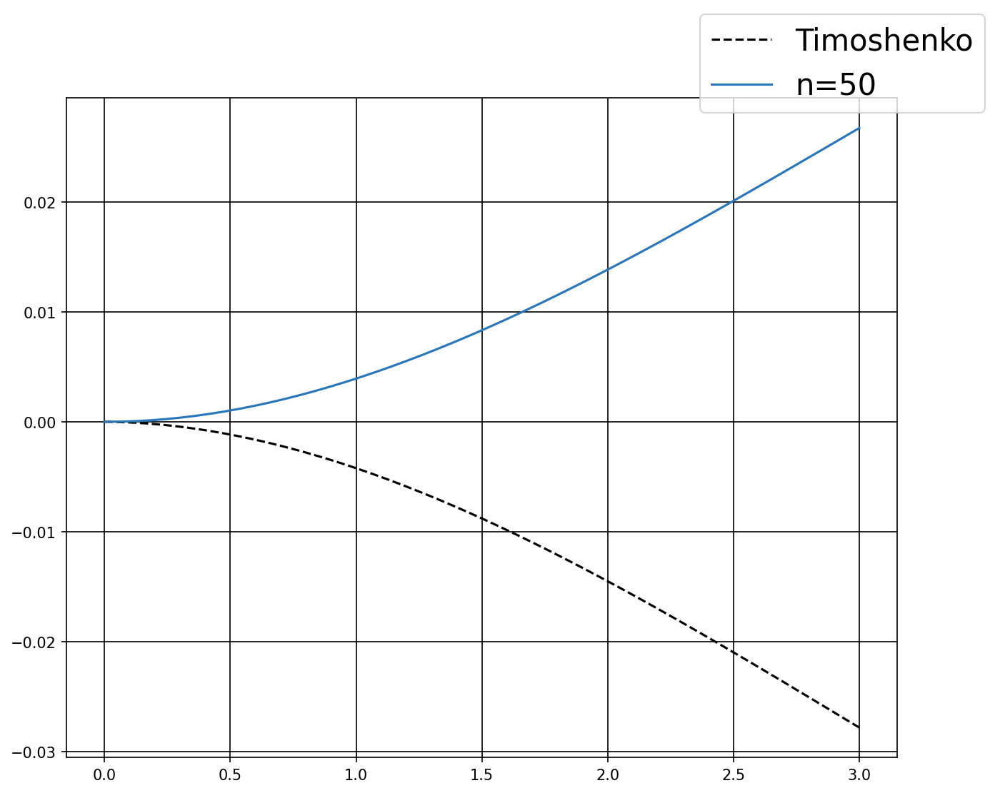

plot video


CalledProcessError: ignored

<Figure size 1500x1200 with 0 Axes>

In [ ]:
__doc__ = """Timoshenko beam validation case, for detailed explanation refer to
Gazzola et. al. R. Soc. 2018  section 3.4.3 """

class TimoshenkoBeamSimulator(
    ea.BaseSystemCollection, ea.Constraints, ea.Forcing, ea.CallBacks, ea.Damping
):
    pass


timoshenko_sim = TimoshenkoBeamSimulator()
final_time = 500.0 # lower time for easier sim -- change to 5000 for result plotting

# Options
PLOT_FIGURE = True
PLOT_VIDEO = True
SAVE_FIGURE = True
# SAVE_RESULTS = False
ADD_UNSHEARABLE_ROD = False

# setting up test params
n_elem = 50 #100
direction1 = np.array([0.0, 0.0, 1.0])
normal1 = np.array([0.0, 1.0, 0.0])
base_length = 3.0
base_radius = 0.25
base_area = np.pi * base_radius ** 2
startrod1 = np.zeros((3,))
density = 965 #kg/m^3
volume = base_length * np.pi*base_radius**2
nu = 1 #/ 7 / density / base_area
E = 1.32e6
mass = volume * density

# For shear modulus of 1e4, nu is 99!
poisson_ratio = 0.45
shear_modulus = E / (poisson_ratio + 1.0)

# Rod 1
rod1 = ea.CosseratRod.straight_rod(
    n_elem,
    startrod1,
    direction1,
    normal1,
    base_length,
    base_radius,
    density,
    youngs_modulus=E,
    shear_modulus=shear_modulus,
)
timoshenko_sim.append(rod1)

# add bc
timoshenko_sim.constrain(rod1).using(
    ea.OneEndFixedBC, constrained_position_idx=(0,), constrained_director_idx=(0,)
)

# add force
end_force = np.array([-50.0, 0.0, 0.0])

# Add forces to rod1
timoshenko_sim.add_forcing_to(rod1).using(
    EndpointForcesSin,
    start_force=0,
    end_force=end_force[0],
    ramp_up_time=0.2
)

# Beam parameters (should be changed)
length1 = 0.05
length2 = 0.05
length3 = 0.05
width1 = 0.05
width2 = 0.05
width3 = 0.05
height1 = 1
height2 = 1
height3 = 1

# Moment of Inertia
A1 = length1 * width1
A2 = length2 * width2
A3 = length3 * width3

Ix1 = (width1 * height1**3) / 12
Ix2 = (width2 * height2**3) / 12
Ix3 = (width3 * height3**3) / 12

Iy1 = (height1 * width1**3) / 12 + A1 * (height1 / 2 + height2 /2)**2
if (height2 - height2) == 0:
  Iy2 = (height2 * width2**3) / 12
else:
  Iy2 = (height2 * width2**3) / 12 + A2 * (height2 - height2 /2)**2
Iy3 = (height3 * width3**3) / 12 + A3 * (height3 / 2 + height2 /2)**2

d = width2 / 2 + width1 / 2

Iz1 = Ix1 + A1 * (d - width1/2)**2
Iz3 = Ix3 + A3 * (d - width2/2)**2
Iz2 = Ix2 #centroidal moment

Ix = Ix1 + Ix2 + Ix3
Iy = Iy1 + Iy2 + Iy3
Iz = Iz1 + Iz2 + Iz3

# print(Iz)

# Ix = 1
# Iy = 1
# Iz = 1

# Bend matrix changes
bend_1 = E*Ix
bend_2 = E*Iy
bend_3 = shear_modulus*Iz

print("Bend1:", rod1.bend_matrix)

rod1.bend_matrix[0, 0, :] = bend_1*np.ones(n_elem - 1)
rod1.bend_matrix[1, 1, :] = bend_2*np.ones(n_elem - 1)
rod1.bend_matrix[2, 2, :] = bend_3*np.ones(n_elem - 1)

print("Bend2:", rod1.bend_matrix)

# Shear matrix changes
alpha_c = 3/2 # for rectangle -- assume this shear correction factor for our I-beam

shear_1 = shear_modulus*base_area*alpha_c
shear_2 = shear_modulus*base_area*alpha_c
shear_3 = E*base_area

print("Shear1:", rod1.shear_matrix)

rod1.shear_matrix[0, 0, :] = shear_1*np.ones(n_elem)
rod1.shear_matrix[1, 1, :] = shear_2*np.ones(n_elem)
rod1.shear_matrix[2, 2, :] = shear_3*np.ones(n_elem)

print("Shear2:", rod1.shear_matrix)

# add damping
dl = base_length / n_elem
dt = 7e-3 * dl
timoshenko_sim.dampen(rod1).using(
    ea.AnalyticalLinearDamper,
    damping_constant=nu,
    time_step=dt,
)

analytical_cantilever_soln = AnalyticalDynamicCantilever(
        base_length,
        base_area,
        E,
        density,
        Iz, # about z direction, but maybe we want to make our own for 3D
        mode=0,
        end_velocity=0,
        )

initial_velocity = analytical_cantilever_soln.get_initial_velocity_profile(
        rod1.position_collection[0, :]
    )
rod1.velocity_collection[2, :] = initial_velocity

if ADD_UNSHEARABLE_ROD:
    # Start into the plane
    unshearable_start = np.array([0.0, -1.0, 0.0])
    shear_modulus = E / (-0.7 + 1.0)
    unrod1 = ea.CosseratRod.straight_rod(
        n_elem,
        unshearable_start,
        direction1,
        normal1,
        base_length,
        base_radius,
        density,
        youngs_modulus=E,
        # Unshearable rod needs G -> inf, which is achievable with -ve poisson ratio
        shear_modulus=shear_modulus,
    )

    timoshenko_sim.append(unrod1)

    # add damping
    timoshenko_sim.dampen(unrod1).using(
        ea.AnalyticalLinearDamper,
        damping_constant=nu,
        time_step=dt,
    )
    timoshenko_sim.constrain(unrod1).using(
        ea.OneEndFixedBC, constrained_position_idx=(0,), constrained_director_idx=(0,)
    )
    timoshenko_sim.add_forcing_to(unrod1).using(
        ea.EndpointForces, 0.0 * end_force, end_force, ramp_up_time=final_time / 2.0
    )

# Add call backs
class CantileverCallBack(ea.CallBackBaseClass):
    def __init__(self, step_skip: int, callback_params: dict):
        ea.CallBackBaseClass.__init__(self)
        self.every = step_skip
        self.callback_params = callback_params

    def make_callback(self, system, time, current_step: int):

        if current_step % self.every == 0:

            self.callback_params["time"].append(time)
            self.callback_params["position"].append(
                system.position_collection.copy()
            )
            self.callback_params["deflection"].append(
                system.position_collection[2, -1].copy()
            )
            return

deflection_history = ea.defaultdict(list)
timoshenko_sim.collect_diagnostics(rod1).using(
    CantileverCallBack, step_skip=500, callback_params=deflection_history
)

recorded_history = ea.defaultdict(list) # default dict for plotting
timoshenko_sim.collect_diagnostics(rod1).using(
    ea.MyCallBack, step_skip=500, callback_params=recorded_history
)

timoshenko_sim.finalize()
timestepper = ea.PositionVerlet()
# timestepper = PEFRL()

total_steps = int(final_time / dt)
print("Total steps", total_steps)
ea.integrate(timestepper, timoshenko_sim, final_time, total_steps)


if PLOT_FIGURE:
    plot_timoshenko(rod1, end_force, SAVE_FIGURE, ADD_UNSHEARABLE_ROD)

# if SAVE_RESULTS:
#     import pickle

#     filename = "Timoshenko_beam_data.dat"
#     file = open(filename, "wb")
#     pickle.dump(rod1, file)
#     file.close()

#     tv = (
#         np.asarray(recorded_history["time"]),
#         np.asarray(recorded_history["velocity_norms"]),
#     )

#     def as_time_series(v):
#         return v.T

#     np.savetxt(
#         "velocity_norms.csv",
#         as_time_series(np.stack(tv)),
#         delimiter=",",
#     )

if PLOT_VIDEO:
    filename = "timoshenko_I_beam.mp4"
    plot_video(recorded_history, video_name=filename, margin=0.2, fps=100)
    plot_video_xy(
        recorded_history, video_name=filename + "_xy.mp4", margin=0.2, fps=100
    )
    plot_video_xz(
        recorded_history, video_name=filename + "_xz.mp4", margin=0.2, fps=100
    )

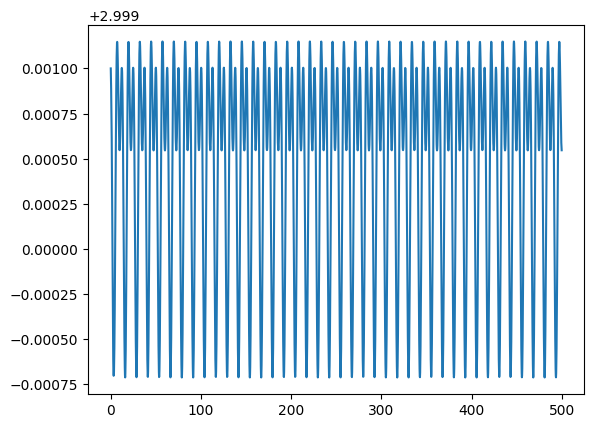

In [ ]:
plt.plot(deflection_history["time"], deflection_history["deflection"])

# Aarish Adjusted Model for CMA

In [ ]:
__doc__ = """Timoshenko beam validation case, for detailed explanation refer to
Gazzola et. al. R. Soc. 2018  section 3.4.3 """

class TimoshenkoBeamSimulator(
    ea.BaseSystemCollection, ea.Constraints, ea.Forcing, ea.CallBacks, ea.Damping
):
    pass

def simulateIBeam(length1, length2, length3, width1, width2, width3, height1, height2, height3, end_force):
  timoshenko_sim = TimoshenkoBeamSimulator()
  final_time = 500.0 # lower time for easier sim -- change to 5000 for result plotting

  # Diane's Test Parameters
  # setting up test params
  n_elem = 50 #100
  direction1 = np.array([0.0, 0.0, 1.0])
  normal1 = np.array([0.0, 1.0, 0.0])
  base_length = 3.0
  base_radius = 0.25
  base_area = np.pi * base_radius ** 2
  startrod1 = np.zeros((3,))
  density = 965 #kg/m^3
  volume = base_length * np.pi*base_radius**2
  nu = 1 #/ 7 / density / base_area
  E = 1.32e6
  mass = volume * density

  # For shear modulus of 1e4, nu is 99!
  poisson_ratio = 0.45
  shear_modulus = E / (poisson_ratio + 1.0)

  # Rod 1
  rod1 = ea.CosseratRod.straight_rod(
      n_elem,
      startrod1,
      direction1,
      normal1,
      base_length,
      base_radius,
      density,
      youngs_modulus=E,
      shear_modulus=shear_modulus,
  )
  timoshenko_sim.append(rod1)

  # add bc
  timoshenko_sim.constrain(rod1).using(
      ea.OneEndFixedBC, constrained_position_idx=(0,), constrained_director_idx=(0,)
  )

  # add force

  # Add forces to rod1
  timoshenko_sim.add_forcing_to(rod1).using(
      EndpointForcesSin,
      start_force=0,
      end_force=end_force[0],
      ramp_up_time=0.2
  )

  Iz = replaceBendMatrix(rod1, E, shear_modulus, n_elem, length1, length2, length3, width1, width2, width3, height1, height2, height3)

  replaceShearMatrix(rod1, shear_modulus, E, base_area, n_elem)

  # add damping
  dl = base_length / n_elem
  dt = 7e-3 * dl
  timoshenko_sim.dampen(rod1).using(
      ea.AnalyticalLinearDamper,
      damping_constant=nu,
      time_step=dt,
  )

  analytical_cantilever_soln = AnalyticalDynamicCantilever(
          base_length,
          base_area,
          E,
          density,
          Iz, # about z direction, but maybe we want to make our own for 3D
          mode=0,
          end_velocity=0,
          )

  initial_velocity = analytical_cantilever_soln.get_initial_velocity_profile(
          rod1.position_collection[0, :]
      )
  rod1.velocity_collection[2, :] = initial_velocity

  deflection_history = ea.defaultdict(list)
  timoshenko_sim.collect_diagnostics(rod1).using(
      CantileverCallBack, step_skip=500, callback_params=deflection_history
  )

  recorded_history = ea.defaultdict(list) # default dict for plotting
  timoshenko_sim.collect_diagnostics(rod1).using(
      ea.MyCallBack, step_skip=500, callback_params=recorded_history
  )

  timoshenko_sim.finalize()
  timestepper = ea.PositionVerlet()
  # timestepper = PEFRL()

  total_steps = int(final_time / dt)
  print("Total steps", total_steps)
  ea.integrate(timestepper, timoshenko_sim, final_time, total_steps)

  return 1e4*abs(base_length*np.ones(len(deflection_history["deflection"])) - deflection_history["deflection"])
  # return deflection_history["deflection"], deflection_history["time"]

def replaceBendMatrix(rod1, E, shear_modulus, n_elem, length1, length2, length3, width1, width2, width3, height1, height2, height3):

  # Moment of Inertia
  A1 = length1 * width1
  A2 = length2 * width2
  A3 = length3 * width3

  Ix1 = (width1 * height1**3) / 12
  Ix2 = (width2 * height2**3) / 12
  Ix3 = (width3 * height3**3) / 12

  Iy1 = (height1 * width1**3) / 12 + A1 * (height1 / 2 + height2 /2)**2
  if (height2 - height2) == 0:
    Iy2 = (height2 * width2**3) / 12
  else:
    Iy2 = (height2 * width2**3) / 12 + A2 * (height2 - height2 /2)**2
  Iy3 = (height3 * width3**3) / 12 + A3 * (height3 / 2 + height2 /2)**2

  d = width2 / 2 + width1 / 2

  Iz1 = Ix1 + A1 * (d - width1/2)**2
  Iz3 = Ix3 + A3 * (d - width2/2)**2
  Iz2 = Ix2 #centroidal moment

  Ix = Ix1 + Ix2 + Ix3
  Iy = Iy1 + Iy2 + Iy3
  Iz = Iz1 + Iz2 + Iz3

  # Bend matrix changes
  bend_1 = E*Ix
  bend_2 = E*Iy
  bend_3 = shear_modulus*Iz

  # print("Bend1:", rod1.bend_matrix)

  rod1.bend_matrix[0, 0, :] = bend_1*np.ones(n_elem - 1)
  rod1.bend_matrix[1, 1, :] = bend_2*np.ones(n_elem - 1)
  rod1.bend_matrix[2, 2, :] = bend_3*np.ones(n_elem - 1)

  # print("Bend2:", rod1.bend_matrix)

  return Iz

def replaceShearMatrix(rod1, shear_modulus, E, base_area, n_elem):
  # Shear matrix changes
  alpha_c = 3/2 # for rectangle -- assume this shear correction factor for our I-beam

  shear_1 = shear_modulus*base_area*alpha_c
  shear_2 = shear_modulus*base_area*alpha_c
  shear_3 = E*base_area

  # print("Shear1:", rod1.shear_matrix)

  rod1.shear_matrix[0, 0, :] = shear_1*np.ones(n_elem)
  rod1.shear_matrix[1, 1, :] = shear_2*np.ones(n_elem)
  rod1.shear_matrix[2, 2, :] = shear_3*np.ones(n_elem)

  # print("Shear2:", rod1.shear_matrix)

# Add call backs
class CantileverCallBack(ea.CallBackBaseClass):
    def __init__(self, step_skip: int, callback_params: dict):
        ea.CallBackBaseClass.__init__(self)
        self.every = step_skip
        self.callback_params = callback_params

    def make_callback(self, system, time, current_step: int):

        if current_step % self.every == 0:

            self.callback_params["time"].append(time)
            self.callback_params["position"].append(
                system.position_collection.copy()
            )
            self.callback_params["deflection"].append(
                system.position_collection[2, -1].copy()
            )
            return

In [ ]:
absDeflection = simulateIBeam(0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 1, 1, 1, [-50.0, 0.0, 0.0])

Total steps 1190476


100%|██████████| 1190476/1190476 [02:31<00:00, 7834.91it/s] 

Final time of simulation is :  499.9999999754841


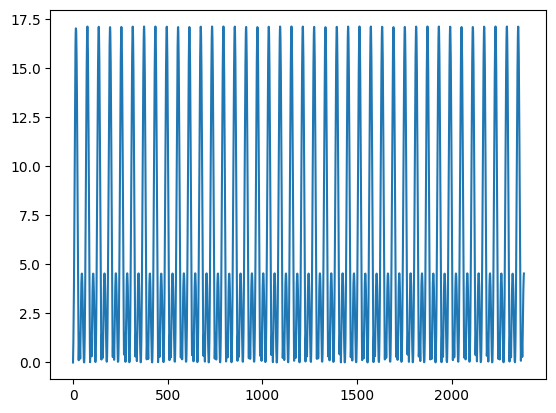

In [ ]:
plt.plot(absDeflection)

# Aarish + Yuree CMA Imp

In [ ]:
# CMA

import numpy as np
from numpy.random import multivariate_normal
from tqdm import tqdm
import copy

class CMAES:
    """Naive CMA implementation"""

    def __init__(self, initial_mean, sigma, popsize, generations_to_run, **kwargs):
        self.centroid = np.asarray(initial_mean).copy()
        self.sigma = sigma
        self.pc = np.zeros_like(initial_mean)
        self.ps = np.zeros_like(initial_mean)
        self.C = np.eye(initial_mean.shape[0])
        self.B = np.eye(self.C.shape[0])
        self.diagD = np.ones(initial_mean.shape[0])

        # Optimal popsize
        self.popsize = popsize
        self.mu = popsize // 5
        # Update weights later on
        # Constant weight policy
        # self.weights = np.ones((self.mu, )) / self.mu

        # Decreasing weight policy
        self.weights = np.arange(self.mu, 0.0, -1.0)
        self.weights /= np.sum(self.weights)

        # Negative, Positive weight policy
        # unscaled_weights = np.arange(1.0 ,  1.0 + popsize)
        # unscaled_weights = np.log(0.5 * (popsize + 1.0) / unscaled_weights)

        # Utility variables
        self.dim = initial_mean.shape[0]

        # Expectation of a normal distribution
        self.chiN = np.sqrt(self.dim) * (1.0 - 0.25 / self.dim + 1.0/(21.0 * self.dim**2))
        self.mueff = 1.0 / np.linalg.norm(self.weights, 2)**2
        self.generations = 0

        # Options
        self.generations_to_run = generations_to_run
        # Sigma adaptation
        # cs is short for c_sigma
        self.cs = kwargs.get("cs", (2.0 + self.mueff) / (self.dim + self.mueff + 5.0))
        # ds is short for d_sigma
        self.ds = 1.0 + 2.0 * max(0.0, np.sqrt((self.mueff - 1.0)/ (self.dim + 1.0)) - 1.0) + self.cs

        # Covariance adaptation
        self.cc = kwargs.get("cc", (4.0 + self.mueff/self.dim) / (self.dim + 4.0 + 2.0 * self.mueff/self.dim))
        self.ccov = 0.0
        # If implementing the latest version of CMA according to the tutorial,
        # these parameters can be useful
        self.ccov1 = 2.0 / ((self.dim + 1.3)**2 + self.mueff)
        self.ccovmu = min(1.0 - self.ccov1, 2.0 * (self.mueff - 2.0 + 1.0/self.mueff)/((self.dim + 2.0)**2 + self.mueff))

        # Create an array to store fitness values
        self.fitness = np.zeros((self.generations_to_run, 1)) # edit!

        self.stats_centroids = []
        self.stats_new_centroids = []
        self.stats_covs = []
        self.stats_new_covs = []
        self.stats_offspring = []
        self.stats_offspring_weights = []
        self.stats_ps = []

    def update(self, problem, population):
         # -- store current state of the algorithm
        self.stats_centroids.append(copy.deepcopy(self.centroid))
        self.stats_covs.append(copy.deepcopy(self.C))

        pop_fitness = np.zeros(self.popsize)

        for idx in range(self.popsize):
          pop_fitness[idx] = problem.calc_fitness(population[idx])
          print(f'{idx} of {self.popsize} in generation')

        print(pop_fitness)
        index = np.argsort(pop_fitness)
        print(index[::-1])
        population = population[index[::-1]]
        print(population)
        # population.sort(key=lambda ind: problem(ind[0], ind[1]))
        # population.sort(key=problem)

        # -- store sorted offspring
        self.stats_offspring.append(copy.deepcopy(population))

        old_centroid = self.centroid
        # Note : the following does m <- <x>_w
        # Note : this is equivalent to doing m <- m + sigma * <z>_w
        # as x = m + sigma * z provided the weights sum to 1.0 which it
        # does
        self.centroid = np.dot(self.weights, population[0:self.mu])

        # -- store new centroid
        self.stats_new_centroids.append(copy.deepcopy(self.centroid))

        c_diff = self.centroid - old_centroid

        # Cumulation : update evolution path
        # Equivalent to in-class definition
        self.ps = (1 - self.cs) * self.ps \
             + np.sqrt(self.cs * (2 - self.cs) * self.mueff) / self.sigma \
             * np.dot(self.B, (1. / self.diagD) * np.dot(self.B.T, c_diff))

        # -- store new evol path
        self.stats_ps.append(copy.deepcopy(self.ps))

        hsig = float((np.linalg.norm(self.ps) /
                np.sqrt(1. - (1. - self.cs)**(2. * (self.generations + 1.))) / self.chiN
                < (1.4 + 2. / (self.dim + 1.))))

        self.pc = (1 - self.cc) * self.pc + hsig \
                  * np.sqrt(self.cc * (2 - self.cc) * self.mueff) / self.sigma \
                  * c_diff

        # Update covariance matrix
        artmp = population[0:self.mu] - old_centroid
        self.C = (1 - self.ccov1 - self.ccovmu + (1 - hsig) \
                   * self.ccov1 * self.cc * (2 - self.cc)) * self.C \
                + self.ccov1 * np.outer(self.pc, self.pc) \
                + self.ccovmu * np.dot((self.weights * artmp.T), artmp) \
                / self.sigma**2

        # -- store new covs
        self.stats_new_covs.append(copy.deepcopy(self.C))

        self.sigma *= np.exp((np.linalg.norm(self.ps) / self.chiN - 1.) \
                                * self.cs / self.ds)

        self.diagD, self.B = np.linalg.eigh(self.C)
        indx = np.argsort(self.diagD)

        self.cond = self.diagD[indx[-1]]/self.diagD[indx[0]]

        self.diagD = self.diagD[indx]**0.5
        self.B = self.B[:, indx]
        self.BD = self.B * self.diagD

        return population

    def run(self, problem):
        self.reset()  # Reset statistics
        for i in tqdm(range(self.generations_to_run)):

            population = list(multivariate_normal(self.centroid, self.sigma**2 * self.C, self.popsize))
            population = np.array(population)
            print("Pre-Run Population:", population)
            population = self.update(problem, population)
            print("Post-Run Population:", population)
            self.fitness[self.generations] = problem.calc_fitness(population[0])
            self.generations += 1
            print(f"generation {self.generations}")
            print(f'current best: {population[0]}')
            print(f'fitness: {self.fitness}')
        return population[0], self.fitness

    def reset(self):
        # Clears everything to rerun the problem
        self.stats_centroids = []
        self.stats_new_centroids = []
        self.stats_covs = []
        self.stats_new_covs = []
        self.stats_offspring = []
        self.stats_offspring_weights = []
        self.stats_ps = []

class IBeamDeformationProblem:
    def __init__(self, beam_properties, end_force):
        self.beam_properties = beam_properties
        self.end_force = end_force

    def calc_fitness(self, population):
        length1, length2, length3, width1, width2, width3, height1, height2, height3 = population

        deformation_response = simulateIBeam(length1, length2, length3, width1, width2, width3, height1, height2, height3, self.end_force) # returns abs number
        fitness = -max(deformation_response)

        print(fitness)

        boundary = 0
        penalty = 100
        vars = np.array([length1, length2, length3, width1, width2, width3, height1, height2, height3])

        print(vars)

        print(np.where(vars <= boundary))

        print(np.any(vars <= boundary))

        if np.any(vars <= boundary):
            for idx in np.where(vars <= boundary):
                print(vars[idx])
                fitness -= abs(min(vars[idx] * penalty))

        print(fitness)

        return fitness


initial_width1 = 0.05
initial_width2 = 0.05
initial_width3 = 0.05

initial_height1 = 1
initial_height2 = 1
initial_height3 = 1

initial_length1 = 0.05
initial_length2 = 0.05
initial_length3 = 0.05


initial_mean = np.array([initial_length1, initial_length2, initial_length3, initial_width1, initial_width2, initial_width3, initial_height1, initial_height2, initial_height3])

beam_properties = {
    'length1': initial_length1,
    'length2': initial_length2,
    'length3': initial_length3,
    'width1': initial_width1,
    'width2': initial_width2,
    'width3': initial_width3,
    'height1': initial_height1,
    'height2': initial_height2,
    'height3': initial_height3
}

end_force = np.array([-50, 0.0, 0.0])
sigma = 1
pop_size = 5
gen = 10

ibeam_optimization = CMAES(initial_mean=initial_mean, sigma=sigma, popsize=pop_size, generations_to_run=gen)
ibeam_problem = IBeamDeformationProblem(beam_properties, end_force)

# Run the optimization
best_solution, fitnesses = ibeam_optimization.run(ibeam_problem)

  0%|          | 0/10 [00:00<?, ?it/s]

Pre-Run Population: [[-0.7450302   1.80532872 -0.45114455  2.77231413 -0.04485001  0.73024753
   2.7868318   1.75084162  1.08431164]
 [ 0.21235029 -0.00587663 -0.50752324  0.62197932 -0.50159944  0.26029385
   1.07207739  1.15902318  0.70519018]
 [ 0.22105766 -0.30054768 -0.10509192 -0.56063458  0.69703142  0.34300491
  -0.21068814  1.78021202  0.53401794]
 [ 0.20851785  0.17891266 -0.75565165 -0.01207057  0.99362345 -2.38376628
   2.00447975 -1.40627315  0.69621306]
 [ 0.36708623  0.52313844  0.45333268  0.25405025 -0.80637825  0.20257339
   1.33224763  0.98780451  3.82748042]]
Total steps 1190476



100%|██████████| 1190476/1190476 [02:31<00:00, 7846.83it/s]


Final time of simulation is :  499.9999999754841
-0.0
[-0.7450302   1.80532872 -0.45114455  2.77231413 -0.04485001  0.73024753
  2.7868318   1.75084162  1.08431164]
(array([0, 2, 4]),)
True
[-0.7450302  -0.45114455 -0.04485001]
-74.5030204894592
0 of 5 in generation
Total steps 1190476



100%|██████████| 1190476/1190476 [02:33<00:00, 7752.43it/s]


Final time of simulation is :  499.9999999754841
-0.0
[ 0.21235029 -0.00587663 -0.50752324  0.62197932 -0.50159944  0.26029385
  1.07207739  1.15902318  0.70519018]
(array([1, 2, 4]),)
True
[-0.00587663 -0.50752324 -0.50159944]
-50.75232422268379
1 of 5 in generation
Total steps 1190476



100%|██████████| 1190476/1190476 [02:38<00:00, 7494.69it/s]
<ipython-input-4-7d2809340a12>:77: RuntimeWarning: invalid value encountered in sqrt
  self.omega = (self.beta ** 2) * np.sqrt(


Final time of simulation is :  499.9999999754841
-0.0
[ 0.22105766 -0.30054768 -0.10509192 -0.56063458  0.69703142  0.34300491
 -0.21068814  1.78021202  0.53401794]
(array([1, 2, 3, 6]),)
True
[-0.30054768 -0.10509192 -0.56063458 -0.21068814]
-56.06345760572141
2 of 5 in generation
Total steps 1190476



100%|██████████| 1190476/1190476 [02:45<00:00, 7203.34it/s]


Final time of simulation is :  499.9999999754841
-0.0
[ 0.20851785  0.17891266 -0.75565165 -0.01207057  0.99362345 -2.38376628
  2.00447975 -1.40627315  0.69621306]
(array([2, 3, 5, 7]),)
True
[-0.75565165 -0.01207057 -2.38376628 -1.40627315]
-238.37662838209366
3 of 5 in generation
Total steps 1190476



100%|██████████| 1190476/1190476 [02:52<00:00, 6910.54it/s]


Final time of simulation is :  499.9999999754841
-0.0
[ 0.36708623  0.52313844  0.45333268  0.25405025 -0.80637825  0.20257339
  1.33224763  0.98780451  3.82748042]
(array([4]),)
True
[-0.80637825]
-80.63782495525842
4 of 5 in generation
[ -74.50302049  -50.75232422  -56.06345761 -238.37662838  -80.63782496]
[1 2 0 4 3]
[[ 0.21235029 -0.00587663 -0.50752324  0.62197932 -0.50159944  0.26029385
   1.07207739  1.15902318  0.70519018]
 [ 0.22105766 -0.30054768 -0.10509192 -0.56063458  0.69703142  0.34300491
  -0.21068814  1.78021202  0.53401794]
 [-0.7450302   1.80532872 -0.45114455  2.77231413 -0.04485001  0.73024753
   2.7868318   1.75084162  1.08431164]
 [ 0.36708623  0.52313844  0.45333268  0.25405025 -0.80637825  0.20257339
   1.33224763  0.98780451  3.82748042]
 [ 0.20851785  0.17891266 -0.75565165 -0.01207057  0.99362345 -2.38376628
   2.00447975 -1.40627315  0.69621306]]
Post-Run Population: [[ 0.21235029 -0.00587663 -0.50752324  0.62197932 -0.50159944  0.26029385
   1.07207739  1.


 10%|█         | 1/10 [16:25<2:27:52, 985.79s/it]

Final time of simulation is :  499.9999999754841
-0.0
[ 0.21235029 -0.00587663 -0.50752324  0.62197932 -0.50159944  0.26029385
  1.07207739  1.15902318  0.70519018]
(array([1, 2, 4]),)
True
[-0.00587663 -0.50752324 -0.50159944]
-50.75232422268379
generation 1
current best: [ 0.21235029 -0.00587663 -0.50752324  0.62197932 -0.50159944  0.26029385
  1.07207739  1.15902318  0.70519018]
fitness: [[-50.75232422]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]]
Pre-Run Population: [[ 1.51483302 -0.22085179 -1.75695193  1.02129653 -1.2133554  -0.54864369
   0.87725003  2.02798078  1.47186417]
 [ 0.92230641  0.29149971 -1.03739399  0.6538452  -0.19603579 -0.37330675
   0.91661338  2.17411099  0.70842672]
 [ 1.63892247 -1.08496705 -0.70809902  1.08473262  0.42964444  1.91587436
   1.29976276  0.67586573  1.25335919]
 [ 0.16360691  0.87706867 -0.24264339  1.0724596  -1.63470777 -2.41934908
   0.8681941


100%|██████████| 1190476/1190476 [03:09<00:00, 6284.06it/s]


Final time of simulation is :  499.9999999754841
-0.0
[ 1.51483302 -0.22085179 -1.75695193  1.02129653 -1.2133554  -0.54864369
  0.87725003  2.02798078  1.47186417]
(array([1, 2, 4, 5]),)
True
[-0.22085179 -1.75695193 -1.2133554  -0.54864369]
-175.69519253736036
0 of 5 in generation
Total steps 1190476



100%|██████████| 1190476/1190476 [03:13<00:00, 6156.79it/s]


Final time of simulation is :  499.9999999754841
-0.0
[ 0.92230641  0.29149971 -1.03739399  0.6538452  -0.19603579 -0.37330675
  0.91661338  2.17411099  0.70842672]
(array([2, 4, 5]),)
True
[-1.03739399 -0.19603579 -0.37330675]
-103.7393993046524
1 of 5 in generation
Total steps 1190476



100%|██████████| 1190476/1190476 [03:16<00:00, 6071.12it/s]


Final time of simulation is :  499.9999999754841
-0.0
[ 1.63892247 -1.08496705 -0.70809902  1.08473262  0.42964444  1.91587436
  1.29976276  0.67586573  1.25335919]
(array([1, 2]),)
True
[-1.08496705 -0.70809902]
-108.49670537303223
2 of 5 in generation
Total steps 1190476



100%|██████████| 1190476/1190476 [03:11<00:00, 6207.56it/s]


Final time of simulation is :  499.9999999754841
-0.0
[ 0.16360691  0.87706867 -0.24264339  1.0724596  -1.63470777 -2.41934908
  0.86819418  1.13531794  0.12780386]
(array([2, 4, 5]),)
True
[-0.24264339 -1.63470777 -2.41934908]
-241.93490780337595
3 of 5 in generation
Total steps 1190476



100%|██████████| 1190476/1190476 [03:08<00:00, 6316.48it/s]


Final time of simulation is :  499.9999999754841
-0.0
[-0.4626655   0.87108918  1.1089732   0.0416842  -1.58147925 -0.97979477
  0.95396815  0.52802365  1.32448054]
(array([0, 4, 5]),)
True
[-0.4626655  -1.58147925 -0.97979477]
-158.14792454451464
4 of 5 in generation
[-175.69519254 -103.7393993  -108.49670537 -241.9349078  -158.14792454]
[1 2 4 0 3]
[[ 0.92230641  0.29149971 -1.03739399  0.6538452  -0.19603579 -0.37330675
   0.91661338  2.17411099  0.70842672]
 [ 1.63892247 -1.08496705 -0.70809902  1.08473262  0.42964444  1.91587436
   1.29976276  0.67586573  1.25335919]
 [-0.4626655   0.87108918  1.1089732   0.0416842  -1.58147925 -0.97979477
   0.95396815  0.52802365  1.32448054]
 [ 1.51483302 -0.22085179 -1.75695193  1.02129653 -1.2133554  -0.54864369
   0.87725003  2.02798078  1.47186417]
 [ 0.16360691  0.87706867 -0.24264339  1.0724596  -1.63470777 -2.41934908
   0.86819418  1.13531794  0.12780386]]
Post-Run Population: [[ 0.92230641  0.29149971 -1.03739399  0.6538452  -0.1960357


 20%|██        | 2/10 [35:38<2:24:34, 1084.27s/it]

Final time of simulation is :  499.9999999754841
-0.0
[ 0.92230641  0.29149971 -1.03739399  0.6538452  -0.19603579 -0.37330675
  0.91661338  2.17411099  0.70842672]
(array([2, 4, 5]),)
True
[-1.03739399 -0.19603579 -0.37330675]
-103.7393993046524
generation 2
current best: [ 0.92230641  0.29149971 -1.03739399  0.6538452  -0.19603579 -0.37330675
  0.91661338  2.17411099  0.70842672]
fitness: [[ -50.75232422]
 [-103.7393993 ]
 [   0.        ]
 [   0.        ]
 [   0.        ]
 [   0.        ]
 [   0.        ]
 [   0.        ]
 [   0.        ]
 [   0.        ]]
Pre-Run Population: [[ 0.60131613  0.76053666 -0.58796968 -0.01437712 -0.25028815 -0.84707551
   1.91721121  2.29022756  1.16907816]
 [ 0.80880732  0.6185314  -2.34674301  0.00484254 -1.43656711  0.06220761
   1.42487376  1.84686625  1.17746492]
 [ 2.14501217  0.3538939   0.48555544  1.21164256  0.24311969  0.51473201
   1.3681521   2.98387663  1.29389789]
 [ 1.91252649  0.8847896  -1.96650513  2.65564436 -0.29473857  1.21489979
  


100%|██████████| 1190476/1190476 [03:16<00:00, 6058.28it/s]


Final time of simulation is :  499.9999999754841
-0.0
[ 0.60131613  0.76053666 -0.58796968 -0.01437712 -0.25028815 -0.84707551
  1.91721121  2.29022756  1.16907816]
(array([2, 3, 4, 5]),)
True
[-0.58796968 -0.01437712 -0.25028815 -0.84707551]
-84.70755092236179
0 of 5 in generation
Total steps 1190476



100%|██████████| 1190476/1190476 [03:14<00:00, 6116.59it/s]


Final time of simulation is :  499.9999999754841
-0.0
[ 0.80880732  0.6185314  -2.34674301  0.00484254 -1.43656711  0.06220761
  1.42487376  1.84686625  1.17746492]
(array([2, 4]),)
True
[-2.34674301 -1.43656711]
-234.6743010148109
1 of 5 in generation
Total steps 1190476



100%|██████████| 1190476/1190476 [03:10<00:00, 6260.26it/s]


Final time of simulation is :  499.9999999754841
-0.0
[2.14501217 0.3538939  0.48555544 1.21164256 0.24311969 0.51473201
 1.3681521  2.98387663 1.29389789]
(array([], dtype=int64),)
False
-0.0
2 of 5 in generation
Total steps 1190476



100%|██████████| 1190476/1190476 [03:12<00:00, 6186.19it/s]


Final time of simulation is :  499.9999999754841
-0.0
[ 1.91252649  0.8847896  -1.96650513  2.65564436 -0.29473857  1.21489979
  0.15757112  1.95929123  0.33776937]
(array([2, 4]),)
True
[-1.96650513 -0.29473857]
-196.65051259519083
3 of 5 in generation
Total steps 1190476



 32%|███▏      | 379905/1190476 [01:01<02:54, 4649.30it/s]

In [ ]:
# Debugging of population and fitness values
array = np.array([-12.53705923, -11.27342159, -13.60916732, -21.25721544, -19.31362063,
 -10.68800542, -14.91291962,  -6.51117415, -12.94241799,  -0.        ])

sorted = np.argsort(array)

population = array[sorted[::-1]]

print(population)

[ -0.          -6.51117415 -10.68800542 -11.27342159 -12.53705923
 -12.94241799 -13.60916732 -14.91291962 -19.31362063 -21.25721544]


# Aarish CMA Plotting Fcn

In [ ]:
import pylab as plt
import seaborn as sns
sns.set_context("talk", font_scale=1.5, rc={"lines.linewidth": 2.5})

%matplotlib inline
plt.figure(figsize=(12,12))
plt.plot(fitnesses,'-o', lw=3, ms=20, label='from scratch')
plt.xlabel("Iteration")
plt.ylabel("Fitness")
plt.title("Best Fitness over Generations")
plt.yscale("log")
plt.show()

%matplotlib inline
plt.figure(figsize=(12,12))
plt.plot(fitnesses,'-o', lw=3, ms=20, label='from scratch')
plt.xlabel("Iteration")
plt.ylabel("Fitness")
plt.title("Best Fitness over Generations")
plt.yscale("linear")
plt.show()

# Aarish Shear Matrix Experimentation

In [ ]:
rod1.bend_matrix
# shape = (3, 3, 100)

array([[[3067.96157577, 3067.96157577, 3067.96157577, 3067.96157577,
         3067.96157577, 3067.96157577, 3067.96157577, 3067.96157577,
         3067.96157577, 3067.96157577, 3067.96157577, 3067.96157577,
         3067.96157577, 3067.96157577, 3067.96157577, 3067.96157577,
         3067.96157577, 3067.96157577, 3067.96157577, 3067.96157577,
         3067.96157577, 3067.96157577, 3067.96157577, 3067.96157577,
         3067.96157577, 3067.96157577, 3067.96157577, 3067.96157577,
         3067.96157577, 3067.96157577, 3067.96157577, 3067.96157577,
         3067.96157577, 3067.96157577, 3067.96157577, 3067.96157577,
         3067.96157577, 3067.96157577, 3067.96157577, 3067.96157577,
         3067.96157577, 3067.96157577, 3067.96157577, 3067.96157577,
         3067.96157577, 3067.96157577, 3067.96157577, 3067.96157577,
         3067.96157577, 3067.96157577, 3067.96157577, 3067.96157577,
         3067.96157577, 3067.96157577, 3067.96157577, 3067.96157577,
         3067.96157577, 3067.96157

In [ ]:
n_elem = 100
direction1 = np.array([0.0, 0.0, 1.0])
normal1 = np.array([0.0, 1.0, 0.0])
base_length = 3.0
base_radius = 0.25
base_area = np.pi * base_radius ** 2
startrod1 = np.zeros((3,))
density = 5000
volume = base_length * np.pi*base_radius**2
nu = 0.1 / 7 / density / base_area
E = 1e6
mass = volume * density

# For shear modulus of 1e4, nu is 99!
poisson_ratio = 99
shear_modulus = E / (poisson_ratio + 1.0)

alpha_c = 3/2 # for rectangle -- assume this shear correction factor for our I-beam

shear_1 = shear_modulus*base_area*alpha_c
shear_2 = shear_modulus*base_area*alpha_c
shear_3 = E*base_area

rod1.shear_matrix[0, 0] = shear_1*np.ones(n_elem)
rod1.shear_matrix[1, 1] = shear_2*np.ones(n_elem)
rod1.shear_matrix[2, 2] = shear_3*np.ones(n_elem)

Iz = 0.5 * mass * base_radius**2
Ix = mass * (base_length**2 + 3*base_radius**2) / 12
Iy = Ix

print(E*Ix)

2254951758.1918926


# Diane Endpoint Force Sinusoidal Class Modification